# Segmentation Model

This notebook marks the strategic shift in the project, moving away from the multi-task prototype to focus exclusively on developing a high-performance **Segmentation Model**.  
If you want, you can see official Keras documentation here: [U-Net Xception Style](https://keras.io/examples/vision/oxford_pets_image_segmentation/)

<div style="text-align: center;">
    <img src="../images/unet-arch.png" alt="U-Net Architecture" style="display: block; margin: 0 auto;">
</div>


## Core Objective

The sole goal is to train the U-Net Xception-style architecture to achieve the highest possible accuracy in **binary lung segmentation** (identifying the lung region) by leveraging the entire available dataset.

---

## Deep Dive into Segmentation Strategy

### 1. Architecture and Output
* **Model Architecture:** We utilize a **U-Net architecture with Xception-style residual blocks**.  This encoder-decoder design is the industry standard for biomedical image segmentation, efficiently capturing global context (encoder) and enabling precise localization (decoder).
* **Single-Output Design:** The model is simplified to a **single-output head** (named `segmentation`). This output is a 2D feature map with a single channel, matching the size of the input image.
* **Output Activation:** The final layer uses a **`sigmoid` activation** to squash the output values between 0 and 1, representing the probability of a pixel belonging to the lung mask.

### 2. Loss and Metrics
* **Loss Function:** The training uses **Binary Crossentropy**, a standard loss for binary pixel-wise classification, measuring the difference between the predicted pixel probabilities and the ground truth binary mask.
* **Performance Metrics:** Success is measured by two critical segmentation-specific metrics:
    1.  **Dice Coefficient (F1 Score):** Measures the overlap between the predicted mask and the ground truth mask. It is directly optimized to handle imbalanced classes (large background vs. small foreground).
    2.  **Binary IoU (Intersection over Union):** Quantifies the ratio of the intersection area to the union area of the predicted and true masks, providing a robust measure of mask quality. 

### 3. Data Flow and Augmentation
* **Data Maximization:** The **validation set (`val_files`) has been dropped**. The model is trained on **all available TFRecord files** (`all_files`) to maximize exposure to training samples.
* **Synchronized Augmentation:** The geometric (`RandomFlip`, `RandomRotation`, etc.) and elastic augmentations are **applied synchronously** to the concatenated Image and Mask tensor. This is critical to ensure that any transformation applied to the image is perfectly mirrored on the ground-truth mask.

### 4. Training Control
* **Callbacks Adjustment:** The callbacks (`ModelCheckpoint`, `ReduceLROnPlateau`, `EarlyStopping`) are configured to monitor the segmentation metric, specifically **`dice_coefficient`**, maximizing its value.
* **Model Simplification:** The auxiliary **Classification Head** and its associated loss/metrics have been **removed**.

## Section 1: Environment Setup and Distribution Strategy

This initial section focuses on configuring the notebook's execution environment. It imports all necessary libraries for deep learning (TensorFlow, Keras layers, NumPy, etc.), ensures reproducibility by setting global seeds, and establishes the optimal hardware distribution strategy (TPU, GPU, or CPU) for efficient model training.

---

### 1.1 Library Imports and Version Check

This subsection imports the comprehensive set of tools required for building, training, and managing the model.

* **Core ML Frameworks:** Imports `tensorflow` (`tf`), `numpy` (`np`), `random`, and `os`.
* **Keras/Layer Components:** Imports `tensorflow.keras.layers` (`tfl`), `tensorflow.keras.backend` (`K`), and `tensorflow.keras.metrics`.
* **Utilities:** Imports `math` and `matplotlib.pyplot` (`plt`) for numerical operations and visualization.
* **Version Check:** The TensorFlow version is explicitly printed to confirm compatibility with expected features (e.g., advanced augmentation techniques).

In [1]:
#Import necessary libraries
import tensorflow as tf
import numpy as np
import random
import os
import math
import matplotlib.pyplot as plt
import tensorflow.keras.layers as tfl
from tensorflow.keras import backend as K
from tensorflow.keras import metrics

2025-10-13 19:12:40.567321: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-13 19:12:41.188813: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-10-13 19:12:44.490725: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [2]:
print(tf.__version__)

2.20.0


---
### 1.2 Reproducibility and Utility Functions

This subsection defines helper functions to ensure the training run is deterministic and to initialize the environment's state.

#### 1.2.1 `seed_everthing` Function
This function sets the random seeds across all major components (`tf`, `np`, `random`) to a fixed value (defaulting to 28). This is a best practice to ensure that model weight initialization, data shuffling, and other stochastic processes are identical across runs, making experiments reproducible.

#### 1.2.2 `get_strategy` Function and Distribution Strategy Activation
This function automatically detects the best available hardware accelerator and configures the corresponding TensorFlow Distribution Strategy for parallel computation.

* **TPU Priority:** It first attempts to initialize and connect to a TPU using `TPUClusterResolver` and `tf.distribute.TPUStrategy`.
* **GPU Fallback:** If a TPU is not found, it checks for available GPUs and uses `tf.distribute.MirroredStrategy`, which is optimal for multi-GPU training.
* **CPU Default:** If neither TPU nor GPU is available, it defaults to the standard strategy.
* **Activation:** The function is called, and the resulting `strategy` object is stored. The number of active replicas (cores/GPUs) is printed, confirming the multi-device setup for training.

In [3]:
def seed_everthing(SEED= 28):
    """
    Sets the global random seeds for reproducibility across TensorFlow, NumPy, and Python's random module.
    
    Args:
        SEED (int): The integer seed value to be used.
    """
    # Set the seed for TensorFlow operations (both CPU and GPU)
    tf.random.set_seed(SEED)
    # Set the seed for NumPy's random number generator
    np.random.seed(SEED)
    # Set the seed for Python's built-in random module
    random.seed(SEED)

In [4]:
def get_strategy():
    """
    Detects and returns the best TensorFlow distribution strategy.
    - TPUStrategy for TPU(s)
    - MirroredStrategy for GPU(s)
    - Default strategy for CPU
    """
    try:
        # Try TPU first
        tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='local')
        tf.config.experimental_connect_to_cluster(tpu)
        tf.tpu.experimental.initialize_tpu_system(tpu)
        strategy = tf.distribute.TPUStrategy(tpu)
        print("Using TPU strategy:", type(strategy).__name__)
    except Exception:
        # If TPU not available, try GPU
        gpus = tf.config.list_physical_devices('GPU')
        if gpus:
            strategy = tf.distribute.MirroredStrategy()
            print("Using GPU strategy:", type(strategy).__name__)
        else:
            # Fallback CPU
            strategy = tf.distribute.get_strategy()
            print("No TPU/GPU found. Using CPU strategy:", type(strategy).__name__)

    print("REPLICAS:", strategy.num_replicas_in_sync)
    return strategy

# Call it
strategy = get_strategy()

INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.
INFO:tensorflow:Initializing the TPU system: local
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


I0000 00:00:1760370616.316214     473 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 2248 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1650, pci bus id: 0000:01:00.0, compute capability: 7.5


Using GPU strategy: MirroredStrategy
REPLICAS: 1


---
### 1.3 Hyperparameter and Global Constant Configuration

This subsection defines the critical hyperparameters and global constants that govern the data pipeline setup and the model training process. These values are essential for managing resource allocation, tensor dimensions, and learning dynamics, especially in a distributed training environment.

| Constant | Value | Description |
| :--- | :--- | :--- |
| **`AUTO`** | `tf.data.AUTOTUNE` | Used for dynamic optimization of CPU threads in the data input pipeline. |
| **`IMAGE_SIZE`** | `(256, 256)` | The target spatial dimension for image resizing. |
| **`MASK_SIZE`** | `(256, 256)` | The target spatial dimension for mask resizing, matching the image size. |
| **`SHUFFLE_SIZE`** | `512` | The buffer size used for shuffling the dataset, balancing randomness with memory usage. |
| **`LEARNING_RATE`** | `1e-3` | The initial learning rate for the optimizer. |
| **`NUM_CLASSES`** | `4` | Defines the number of output classes for the classification head (COVID, Normal, Viral Pneumonia, Lung Opacity). |
| **`BATCH_SIZE_PER_REPLICA`** | `8` | The batch size processed by each individual TPU core or GPU. |
| **`GLOBAL_BATCH_SIZE`** | Calculated | The total effective batch size across all available hardware replicas, calculated as `BATCH_SIZE_PER_REPLICA * strategy.num_replicas_in_sync`. |

The output confirms the effective batch size for distributed training:
> `Global Batch size: [Calculated Value]`

In [5]:
AUTO = tf.data.AUTOTUNE
IMAGE_SIZE = (256, 256)
MASK_SIZE = IMAGE_SIZE
SHUFFLE_SIZE = 512
LEARNING_RATE = 1e-3
NUM_CLASSES = 4
BATCH_SIZE_PER_REPLICA = 4
GLOBAL_BATCH_SIZE = 4 * strategy.num_replicas_in_sync
print(f'Global Batch size: {GLOBAL_BATCH_SIZE}')

Global Batch size: 4


## 🛠️ Section 2: Data Augmentation and Preprocessing Pipeline

This section defines the crucial steps for preparing the raw TFRecord data for consumption by the segmentation model. This pipeline ensures data efficiency and applies various augmentations necessary for model robustness, particularly the **synchronized transformation** of both the image and its corresponding mask.

---

### 2.1 Data Augmentation Layers

We define two primary augmentation components using Keras layers, which are applied **in sequence** to the single 4-channel tensor (image + mask). The use of `interpolation='nearest'` is critical for the mask channel to prevent blending and maintain its strict binary (0 or 1) nature.

#### 2.1.1 Geometric Augmentation (`geometric_augmentation` Sequential Model)

This sequential model applies standard spatial transformations that are synchronized across both image and mask. These transformations are non-destructive to the mask's binary values due to the use of nearest neighbor interpolation.

* **RandomFlip:** Randomly flips the image and mask horizontally.
* **RandomRotation:** Rotates the combined tensor by a small factor (up to 5%).
* **RandomTranslation:** Shifts the combined tensor horizontally and vertically by a small factor (up to 5%).
* **RandomZoom:** Randomly zooms the combined tensor in or out.
* **Interpolation/Fill Mode:** All layers strictly use `interpolation='nearest'` and `fill_mode='nearest'` to ensure that pixel values in the mask remain 0 or 1.

#### 2.1.2 Elastic Augmentation (RandomElasticTransform)

This layer applies non-linear, non-rigid deformation by warping the image and mask based on a random displacement field. This technique is highly valuable in medical imaging segmentation as it simulates natural variations in tissue shape. 

* **Factor and Scale:** Controls the intensity and granularity of the displacement applied.
* **Interpolation:** Crucially set to `interpolation='nearest'` to preserve the sharp, binary edges of the ground truth mask.

In [6]:
# Define a Sequential model for standard geometric augmentations
geometric_augmentation = tf.keras.Sequential([
    # Randomly flip the input horizontally
    tf.keras.layers.RandomFlip('horizontal'),
    
    # Randomly rotate the input by a factor between -0.05 and 0.05 radians
    tf.keras.layers.RandomRotation((-0.05, 0.05), interpolation= 'nearest', fill_mode= 'nearest'),
    
    # Randomly translate the image both horizontally and vertically
    tf.keras.layers.RandomTranslation(height_factor= (-0.05, 0.05), 
                                      width_factor= (-0.05, 0.05), 
                                      interpolation= 'nearest', fill_mode= 'nearest'),
    
    # Randomly zoom in or out by up to 10%
    tf.keras.layers.RandomZoom(0.1, interpolation= 'nearest', fill_mode= 'nearest')
], name= 'geometric_augmentation')

# Define a layer for elastic deformation augmentation
elastic_augmentation = tf.keras.layers.RandomElasticTransform(
    factor= 1.0,  # Intensity of the random displacement
    scale= 0.1,   # Scale of the grid used for the transformation
    interpolation= 'nearest' # Use nearest neighbor interpolation (essential for masks)
)

### 2.2 TFRecord Parsing and Preprocessing (`parse_tfrecord_function`)

This function handles the deserialization of the TFRecord data, converting raw bytes into normalized and resized tensors, and formatting the output for the segmentation model.

* **Feature Deserialization:** It reads the `image` (PNG byte string), `mask` (PNG byte string), and the residual `class` (`int64`) features from the record. The `class` feature is present in the record structure but is ignored for the function's output, aligning with the segmentation-only strategy.
* **Image Preprocessing:**
    * The image is decoded, cast to `float32`, and normalized to the $[0, 1]$ range.
    * It is resized to `IMAGE_SIZE` (e.g., 256x256) using **bilinear** interpolation for smooth downsampling, appropriate for continuous image data.
* **Mask Preprocessing:**
    * The mask is decoded, cast to `float32`, and normalized.
    * It is resized to `MASK_SIZE` using **nearest** neighbor interpolation. This method is mandatory for categorical data like masks to prevent the creation of fractional pixel values which would blur the boundaries.
    * A final `tf.round` is applied to ensure the mask is strictly binary (0 or 1).
* **Output Format:** The function returns a simple tuple: `(image, mask)`.

In [7]:
def parse_tfrecord_function(example):
    """
    Parses a single serialized TFRecord example into image and mask tensors.

    It decodes the PNG data, casts the tensors to float, resizes them to 
    the required dimensions (IMAGE_SIZE and MASK_SIZE), and normalizes the pixel values.

    Args:
        example (tf.Tensor): A single serialized TFRecord example string.

    Returns:
        tuple: The preprocessed image tensor and the preprocessed binary mask tensor.
    """
    feature_description = {
        'image': tf.io.FixedLenFeature([], tf.string),
        'mask': tf.io.FixedLenFeature([], tf.string),
        # 'class' is defined but not used in the return, suggesting a segmentation-only focus.
        'class': tf.io.FixedLenFeature([], tf.int64) 
    }
    
    # 1. Deserialize the example string based on the defined feature map.
    example = tf.io.parse_single_example(example, feature_description)
    
    # 2. Decode the raw PNG byte strings into 3-channel (color) image and 1-channel mask.
    image = tf.io.decode_png(example['image'], channels= 3)
    mask = tf.io.decode_png(example['mask'], channels= 1)
    
    # Image Preprocessing:
    image = tf.cast(image, tf.float32) / 255.              # Cast to float and normalize to [0, 1].
    image = tf.image.resize(image, IMAGE_SIZE, method= 'bilinear') # Resize using bilinear interpolation (suitable for images).
    
    # Mask Preprocessing:
    mask = tf.cast(mask, tf.float32) / 255.                # Cast to float.
    mask = tf.image.resize(mask, MASK_SIZE, method= 'nearest')   # Resize using nearest neighbor (preserves sharp mask boundaries).
    mask = tf.round(mask)                                  # Ensure mask is strictly binary (0 or 1).
    
    return image, mask

### 2.3 Synchronized Augmentation Function (`augment` function)

This function orchestrates the application of the defined augmentation layers to both the image and mask simultaneously, ensuring perfect pixel-wise alignment between the input and its ground truth.

* **Concatenation:** The input image (3 channels) and mask (1 channel) are concatenated along the last axis (`axis=-1`) to form a single 4-channel tensor (`combined`).
* **Simultaneous Transformation:** The pre-defined `geometric_augmentation` and `elastic_augmentation` layers are applied sequentially to this combined tensor. This guarantees that every pixel movement is identical for both the image data and the mask labels.
* **Splitting:** The augmented tensor (`combined_aug`) is split back into the augmented image (3 channels) and the augmented mask (1 channel).
* **Finalization:** The augmented mask is re-rounded (`tf.round`) as a final safety step to strictly enforce binary values (0 or 1), compensating for any residual floating-point errors from the interpolation process.
* **Output Format:** The function returns the augmented data as a tuple: `(img_aug, mask_aug)`.

In [8]:
def augment(image, mask):
    """
    Applies synchronized geometric and elastic augmentation to both the image and mask.

    This ensures that transformations applied (e.g., rotation, shift) are identical
    for both the input image and its corresponding ground truth mask.

    Args:
        image (tf.Tensor): The input image batch.
        mask (tf.Tensor): The ground truth mask batch.

    Returns:
        tuple: The augmented image and the augmented, rounded mask.
    """
    # 1. Concatenate the image (3 channels) and mask (1 channel) along the channel axis.
    combined = tf.concat([image, mask], axis= -1)
    
    # 2. Apply geometric transformations (e.g., rotation, flips).
    combined_aug = geometric_augmentation(combined, training= True)
    
    # 3. Apply elastic transformations (e.g., non-linear distortions).
    combined_aug = elastic_augmentation(combined_aug, training= True)
    
    # 4. Split the combined tensor back into the augmented image and mask.
    img_aug, mask_aug = tf.split(combined_aug,
                                 num_or_size_splits= [3, 1],
                                 axis= -1)
    
    # 5. Round the augmented mask to ensure it remains binary (0 or 1).
    mask_aug = tf.round(mask_aug)
    return img_aug, mask_aug

## Section 3: Data Loading and Dataset Preparation

This section defines the optimized TensorFlow Dataset pipeline (`tf.data.Dataset`) used for feeding the model and calculates the crucial training parameters, ensuring efficient data consumption during the segmentation training process.

---

### 3.1 Optimized Data Pipeline (`dataset` function)

This function constructs the highly optimized `tf.data.Dataset` pipeline, configuring it for parallel reading, parsing, shuffling, batching, and prefetching, maximizing I/O and CPU utilization. 

* **File Reading and Non-Determinism:** The pipeline loads data from multiple TFRecord files simultaneously. To maximize speed, data is loaded non-deterministically, ignoring the strict order of files to improve I/O throughput.
* **Parsing:** The `parse_tfrecord_function` (from Section 2) is mapped onto the dataset using parallel processing, handling the heavy CPU load of decoding, normalization, and resizing.
* **Training Path:**
    * The dataset is shuffled to randomize the sample order.
    * Data is batched **first**. Batching uses `drop_remainder=True`, which is mandatory for efficient execution on distributed hardware strategies (like TPUs).
    * The `augment` function (from Section 2) is applied to the **entire batch**, enabling vectorized and highly efficient data augmentation.
* **Prefetching:** `dataset.prefetch(AUTO)` ensures that the next batch of augmented data is ready on the device while the current batch is being processed by the model, minimizing processor idle time.

In [9]:
# Loading all tfrecords files
DATA_DIR = '../data/tfrecords/'
all_files = sorted(tf.io.gfile.glob(os.path.join(DATA_DIR, '*.tfrecord')))

In [10]:
def dataset(tfrecords, batch_size= GLOBAL_BATCH_SIZE, shuffle_size= SHUFFLE_SIZE, is_training= True):
    """
    Creates an optimized tf.data.Dataset pipeline for reading and processing TFRecords.

    Args:
        tfrecords (list): List of paths to TFRecord files.
        batch_size (int): The size of the batch.
        shuffle_size (int): Buffer size for shuffling.
        is_training (bool): Flag to enable/disable shuffling and augmentation.

    Returns:
        tf.data.Dataset: The configured dataset ready for training or validation.
    """
    ignore_order = tf.data.Options()
    # Enables non-deterministic reading for better performance.
    ignore_order.experimental_deterministic = False
    
    # Reads multiple TFRecord files in parallel.
    dataset = tf.data.TFRecordDataset(tfrecords, num_parallel_reads= AUTO)
    dataset = dataset.with_options(ignore_order)
    
    # Parses the serialized TFRecord data into image and mask tensors.
    dataset = dataset.map(parse_tfrecord_function, num_parallel_calls= AUTO)
    
    if is_training:
        # Shuffles the data records before batching.
        dataset = dataset.shuffle(shuffle_size)
        
        # 1. Batch the data FIRST (recommended practice for batch augmentation).
        dataset = dataset.batch(batch_size, drop_remainder= True)
        
        # 2. Apply augmentation SECOND to the entire batch for efficiency.
        dataset = dataset.map(lambda img, mask: augment(img, mask), num_parallel_calls= AUTO)
    else:
        # For validation: batches data without augmentation.
        dataset = dataset.batch(batch_size, drop_remainder= True)
        
    # 3. Prefetches augmented batches to overlap CPU data loading and GPU training time.
    dataset = dataset.prefetch(AUTO)
    return dataset

In [11]:
train_dataset = dataset(all_files, is_training= True)

### 3.2 Sample Counting and Training Parameter Calculation

This single subsection handles the utility for determining the total sample size and uses it to define the training loop parameters.

#### Sample Counting Utility (`count_tfrecord` function)

This helper function is essential for accurately determining the total number of samples (`train_samples`) across all source TFRecord files. The function iterates through the list of TFRecord file paths and sums up every single record contained in the files. This provides the ground truth count required for setting the `steps_per_epoch`.

#### Training Parameters Derivation

With the total number of samples established, the critical **`steps_per_epoch`** is derived.

* **Formula:** `steps_per_epoch` is calculated as the ceiling of the `train_samples` divided by the `GLOBAL_BATCH_SIZE`. 
* **Purpose:** The ceiling function guarantees that the final, potentially partial, batch is always included in every training epoch. This ensures the model sees the entire dataset exactly once per epoch, which is vital for correct convergence and epoch reporting.

In [12]:
def count_tfrecord(tfrecords):
    """
    Counts the total number of records (samples) contained across all listed TFRecord files.

    Args:
        tfrecords (list): A list of file paths to the TFRecord files.

    Returns:
        int: The total number of samples found.
    """
    count = 0
    # Iterates through each file path in the list.
    for tfrecord in tfrecords:
        # Creates a TFRecordDataset for the file and sums the number of records.
        count += sum(1 for _ in tf.data.TFRecordDataset(tfrecord))
    return count

# Execute the function to get the total number of samples in the training set.
train_samples = count_tfrecord(all_files)

# Calculate the number of steps required to complete one full epoch.
# The ceiling function ensures that the last, potentially partial, batch is included.
steps_per_epoch = math.ceil(train_samples / GLOBAL_BATCH_SIZE)

print(f'Steps Per Epoch: {steps_per_epoch}')

2025-10-13 19:20:31.669454: I tensorflow/core/kernels/data/tf_record_dataset_op.cc:390] TFRecordDataset `buffer_size` is unspecified, default to 262144
2025-10-13 19:20:32.535341: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-10-13 19:20:33.679974: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-10-13 19:20:35.680332: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-10-13 19:20:39.654228: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Steps Per Epoch: 5292


---
## Section 4: Model Definition, Compilation, and Metrics

This section covers the core architecture of the segmentation model, the custom metrics required for evaluating mask quality, and the final compilation step within the distributed training strategy scope.

---

### 4.1 Segmentation Model Architecture (`model` function)

The model utilizes a U-Net architecture with Xception-style Separable Convolutional layers in the encoder path, optimized for efficiency and deep feature extraction.
<div style="text-align: center;">
    <img src="../images/unet.png" alt="U-Net Xception Style" style="display: block; margin: 0 auto;">
</div>


#### 4.1.1 Encoder (Downsampling Path)

The encoder iteratively reduces the spatial dimensions while increasing the feature channels, extracting complex, abstract features.

* **Initial Block:** Starts with a standard $3 \times 3$ strided convolution, followed by Batch Normalization and ReLU activation.
* **Xception Blocks:** Subsequent blocks use **SeparableConv2D** layers, which replace standard convolutions to drastically reduce parameter count and computational complexity.
* **Residual Connections:** Each major downsampling step includes a residual connection (`tfl.add`) to bypass potential information loss and aid gradient flow, a key feature borrowed from residual networks.
* **Downsampling:** Max Pooling layers and strided convolutions reduce the feature map size by half in each stage (e.g., $256 \times 256$ to $128 \times 128$, and so on).

#### 4.1.2 Decoder (Upsampling Path)

The decoder symmetrically reconstructs the high-resolution mask from the deep features.

* **Upsampling:** **Conv2DTranspose** layers (deconvolution) and **UpSampling2D** layers are used to increase the feature map size, restoring the original spatial dimensions.
* **Skip Connections:** The residual connection mechanism from the encoder features is crucial here. Features are upsampled and then added to the corresponding decoder stage's output, allowing the model to fuse the low-level positional details (from the encoder) with the high-level semantic context (from the deep decoder path).

#### 4.1.3 Segmentation Output Head

* **Output Layer:** The final layer is a $1 \times 1$ Convolutional layer with a single filter.
* **Activation:** Uses the **Sigmoid** activation, outputting a probability map where values between 0 and 1 represent the likelihood of a pixel belonging to the lung mask.

In [13]:
def model(img_size):
    """
    Constructs the U-Net segmentation model with an Xception-style encoder.

    Args:
        img_size (tuple): The height and width of the input image.

    Returns:
        tf.keras.Model: The compiled U-Net Xception model.
    """
    inputs = tfl.Input(shape= img_size + (3,))

    # Initial Convolution layer for input processing.
    x = tfl.Conv2D(32, 3, strides= 2, padding= 'same')(inputs)
    x = tfl.BatchNormalization()(x)
    x = tfl.Activation('relu')(x)

    previous_block_attention = x

    # Encoder (Downsampling Path) using Xception-style Separable Convolutions.
    for filters in [64, 128, 256]:
        x = tfl.Activation('relu')(x)
        x = tfl.SeparableConv2D(filters, 3, padding= 'same')(x)
        x = tfl.BatchNormalization()(x)

        x = tfl.Activation('relu')(x)
        x = tfl.SeparableConv2D(filters, 3, padding= 'same')(x)
        x = tfl.BatchNormalization()(x)

        # Downsampling via Max Pooling.
        x = tfl.MaxPooling2D(3, strides= 2, padding= 'same')(x)

        # Residual connection from previous block output.
        residual = tfl.Conv2D(filters, 1, strides= 2, padding= 'same')(previous_block_attention)
        x = tfl.add([x, residual])
        previous_block_attention = x


    # Decoder (Upsampling Path) using Conv2DTranspose (Deconvolution).
    for filters in [256, 128, 64, 32]:
        x = tfl.Activation('relu')(x)
        x = tfl.Conv2DTranspose(filters, 3, padding= 'same')(x)
        x = tfl.BatchNormalization()(x)

        x = tfl.Activation('relu')(x)
        x = tfl.Conv2DTranspose(filters, 3, padding= 'same')(x)
        x = tfl.BatchNormalization()(x)

        # Upsampling feature map size.
        x = tfl.UpSampling2D(2)(x)

        # Skip/Residual connection from the encoder path.
        residual = tfl.UpSampling2D(2)(previous_block_attention)
        residual = tfl.Conv2D(filters, 1, padding= 'same')(residual)
        x = tfl.add([x, residual])
        previous_block_attention = x
        
    # Output layer: 1x1 convolution with sigmoid activation for binary mask output.
    outputs = tfl.Conv2D(1, 1, activation= 'sigmoid', padding= 'same', name= 'segmentation')(x)


    # Final model creation from inputs and outputs.
    model = tf.keras.Model(inputs, outputs= outputs)

    return model

### 4.2 Custom Segmentation Metrics

Accurate assessment of segmentation performance requires metrics tailored to mask overlap.

#### 4.2.1 Dice Coefficient (`dice_coefficient` function)

The Dice Coefficient (or F1 Score) is the primary evaluation metric for this project.

* **Definition:** Measures the overlap between the predicted mask (`y_pred`) and the true mask (`y_true`).
* **Robustness:** It is preferred over pixel accuracy for segmentation tasks because it is less sensitive to class imbalance (where the background constitutes most of the image).
* **Implementation:** The function flattens the masks and calculates the overlap, including a small `smooth` factor to prevent division by zero.

#### 4.2.2 Binary Intersection over Union (IoU)

* **Definition:** Quantifies the ratio of the intersection area to the union area of the predicted and true masks.
* **Utility:** Provides a complementary measure of mask quality, often used interchangeably with the Dice Coefficient.

In [21]:
@tf.keras.utils.register_keras_serializable()
# Dice Coefficient Metric
def dice_coefficient(y_true, y_pred, smooth= 1e-6):
    """
    Calculates the Dice Coefficient (F1 Score) for segmentation.

    The Dice coefficient measures the spatial overlap between the predicted 
    and true masks, which is essential for evaluating segmentation quality.

    Args:
        y_true (tf.Tensor): The ground truth mask.
        y_pred (tf.Tensor): The predicted mask (probabilities).
        smooth (float): A small value to prevent division by zero.

    Returns:
        tf.Tensor: The calculated Dice Coefficient.
    """
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    # Calculate intersection and apply the Dice formula.
    interaction = K.sum(y_true_f * y_pred_f)
    return (2 * interaction + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

# Binary Intersection over Union (IoU) metric setup.
iou = metrics.BinaryIoU(target_class_ids=[1], threshold= 0.5)

### 4.3 Model Compilation

The model is compiled within the `strategy.scope()` to ensure all variables and operations are correctly placed for distributed training across available devices (e.g., TPU or multiple GPUs).

* **Loss Function:** **Binary Crossentropy** is used, as the model predicts a probability for each pixel (binary classification per pixel).
* **Optimizer:** The **Adam** optimizer is used with a fixed `LEARNING_RATE`.
* **Metrics:** The model tracks standard `accuracy`, the custom `dice_coefficient`, and the built-in `iou` (Intersection over Union).

In [45]:
with strategy.scope():
    # Model initialization: creates the U-Net Xception architecture with the specified input size.
    model = model(IMAGE_SIZE)

    # Prints a summary of the model architecture, including layer types, output shapes, and parameter counts.
    model.summary()
    
    # Defines the loss function suitable for pixel-wise binary segmentation.
    loss = tf.keras.losses.BinaryCrossentropy()
    
    # Model compilation: configures the model for training.
    model.compile(
    # Sets the Adam optimizer with the global learning rate.
    optimizer = tf.keras.optimizers.Adam(learning_rate= LEARNING_RATE),
    loss = loss,
    # Specifies evaluation metrics: standard accuracy, Dice Coefficient (custom), and IoU (Keras built-in).
    metrics = ['accuracy', dice_coefficient, iou]
    )

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 128, 128,  │        896 │ input_layer_4[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_8[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_15       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_16       │ (None, 128, 128,  │          0 │ activation_15[0]… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_6  │ (None, 128, 128,  │      2,400 │ activation_16[0]… │
│ (SeparableConv2D)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ separable_conv2d… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_17       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_7  │ (None, 128, 128,  │      4,736 │ activation_17[0]… │
│ (SeparableConv2D)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ separable_conv2d… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 64, 64,    │      2,112 │ activation_15[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_7 (Add)         │ (None, 64, 64,    │          0 │ max_pooling2d_3[… │
│                     │ 64)               │            │ conv2d_9[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_18       │ (None, 64, 64,    │          0 │ add_7[0][0]       │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_8  │ (None, 64, 64,    │      8,896 │ activation_18[0]… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ separable_conv2d… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_19       │ (None, 64, 64,    │          0 │ batch_normalizat

 Total params: 2,058,145 (7.85 MB)

 Trainable params: 2,054,369 (7.84 MB)

 Non-trainable params: 3,776 (14.75 KB)

---
## Section 5: Callbacks and Visualization

This section defines the full suite of Keras Callbacks used to monitor, control, and log the segmentation model's training process.

---

### 5.1 Training Control and Logging Callbacks

These callbacks manage the optimization process by controlling convergence, saving the best weights, and logging performance data. All control mechanisms monitor the target metric: **Dice Coefficient**. 

#### 5.1.1 Model Checkpoint (`checkpoint_cb`)

* **Function:** Saves the model's weights to disk.
* **Monitoring:** Tracks `dice_coefficient`.
* **Strategy:** Uses `save_best_only=True` and `mode="max"` to ensure only the version that achieved the highest Dice score is preserved.

#### 5.1.2 Early Stopping (`early_stop_cb`)

* **Function:** Halts training when the monitored metric stops improving, preventing overfitting.
* **Monitoring:** Tracks `dice_coefficient`.
* **Patience:** Waits for 8 epochs of no improvement before stopping.
* **Weight Restoration:** Restores the model weights corresponding to the epoch with the best Dice score.

#### 5.1.3 Reduce Learning Rate on Plateau (`reduce_lr_cb`)

* **Function:** Dynamically reduces the optimizer's learning rate to aid convergence when the loss/metric improvement stalls.
* **Monitoring:** Tracks `dice_coefficient`.
* **Reduction:** Reduces the learning rate by a factor of 0.5.
* **Patience:** Waits for 5 epochs of no improvement before triggering the reduction.

#### 5.1.4 TensorBoard Logging (`tensorboard_cb`)

* **Function:** Saves all necessary logs for visualization in the TensorBoard dashboard.
* **Log Directory:** All data is saved to `./logs/segmentation`.
* **Histograms:** Calculates and saves histograms of layer weights and biases every epoch for deep model inspection.

In [15]:
# Checkpoint callback: Saves the model weights achieving the best Dice Coefficient.
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    # File path where the best model will be saved.
    "../models/segmentation/best_segmentation_model.keras",
    monitor="dice_coefficient",  # Metric to monitor for improvement (Dice Coefficient).
    save_best_only=True,         # Only save the weights if the monitored metric improves.
    mode="max",                  # The metric should be maximized.
    verbose=1
)

# Early Stopping callback: Stops training when the monitored metric plateaus to prevent overfitting.
early_stop_cb = tf.keras.callbacks.EarlyStopping(
    monitor="dice_coefficient",
    patience=8,                  # Number of epochs with no improvement after which training will be stopped.
    restore_best_weights=True,   # Restores model weights from the epoch with the best metric value.
    mode="max",
    verbose=1
)


# Reduce Learning Rate on Plateau callback: Reduces the learning rate when the metric stops improving.
reduce_lr_cb = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="dice_coefficient",
    factor=0.5,                  # Factor by which the learning rate will be reduced (new_lr = old_lr * 0.5).
    patience=5,                  # Number of epochs with no improvement after which learning rate will be reduced.
    min_lr=1e-6,                 # Lower bound on the learning rate.
    verbose=1,
    mode="max"
)

# TensorBoard callback: Enables visualization of training metrics and model graphs.
tensorboard_cb = tf.keras.callbacks.TensorBoard(
    log_dir="./logs/segmentation", # Directory where the log files are written.
    update_freq="epoch",           # Frequency (batch or epoch) at which metrics are written to logs.
    histogram_freq=1               # Frequency (in epochs) at which to compute histogram of layer weights.
)

### 5.2 Custom Segmentation Visualization Callback

This section defines the custom Keras callback used for real-time visual assessment of the model's predictions.

#### Custom Visualization (`SegmentationVisualization` class)

* **Function:** Executes at the end of every epoch (`on_epoch_end`). It takes a small batch from the training dataset, generates a prediction using the current model weights, and then binarizes the probability mask (prediction > 0.5).
* **Output:** Plots the **Input Image**, the **Ground Truth Mask**, and the **Predicted Binary Mask** side-by-side.
* **Purpose:** Provides immediate, high-value visual feedback on mask quality, boundary detection, and the general progress of the segmentation task.

In [16]:
class SegmentationVisualization(tf.keras.callbacks.Callback):
    # Initializes the callback with the training dataset and the number of images to plot.
    def __init__(self, train_dataset, num_images=2):
        super().__init__()
        # Takes only one batch from the dataset to use for periodic visualization.
        self.train_dataset = train_dataset.take(1)
        self.num_images = num_images

    # This method is called automatically at the end of every epoch.
    def on_epoch_end(self, epoch, logs=None):
        # Retrieve the single visualization batch (image and mask).
        for img_batch, mask_batch in self.train_dataset:
            # Predict the mask probabilities using the current model weights.
            pred = self.model.predict(img_batch)
            # Binarize the prediction by applying a 0.5 threshold.
            pred_bin = (pred > 0.5).astype("float32")
            
            # Loop through the desired number of images in the batch to plot.
            for i in range(min(self.num_images, img_batch.shape[0])):
                plt.figure(figsize=(12,4))
                
                # Subplot 1: Input Image
                plt.subplot(1,3,1)
                plt.imshow(img_batch[i])
                plt.title("Image")
                
                # Subplot 2: Ground Truth Mask
                plt.subplot(1,3,2)
                # Plot the mask (single channel).
                plt.imshow(mask_batch[i,:,:,0], cmap='gray')
                plt.title("Mask")
                
                # Subplot 3: Predicted Binary Mask
                plt.subplot(1,3,3)
                # Plot the binarized prediction.
                plt.imshow(pred_bin[i,:,:,0], cmap='gray')
                plt.title("Predicted")
                
                plt.show()
            # Only process and plot one batch.
            break

In [17]:
# Create a visualization callback
vis_cb = SegmentationVisualization(train_dataset, num_images=2)
# Concatenate all callbacks
callbacks = [
    checkpoint_cb,
    early_stop_cb,
    reduce_lr_cb,
    tensorboard_cb,
    vis_cb
]

## Section 6: Model Training and Continuation

This section documents the final step of the pipeline: executing the model training process (`model.fit`) and noting the strategy used for resuming training after an interruption.

---

### 6.1 Training Execution (`model.fit`)

The model training is initiated using the configured dataset and the comprehensive suite of callbacks defined in the previous section.

* **Input Data:** The `train_dataset.repeat()` call ensures the dataset is indefinitely iterable, which is standard practice when providing `steps_per_epoch` manually.
* **Epochs:** Training is configured to run for a maximum of $NUM\_EPOCHS = 50$.
* **Steps per Epoch:** The pre-calculated `steps_per_epoch` value ensures that the model sees the entire training dataset exactly once during each epoch.
* **Callbacks:** The list of callbacks (`callbacks`) fully governs the training loop, managing checkpointing, early stopping, learning rate reduction, and logging. 

Epoch 1/50
5290/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9611 - binary_io_u_1: 0.8519 - dice_coefficient: 0.8879 - loss: 0.1083

2025-10-10 22:57:32.747778: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9611 - binary_io_u_1: 0.8519 - dice_coefficient: 0.8879 - loss: 0.1083
Epoch 1: dice_coefficient improved from None to 0.92289, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


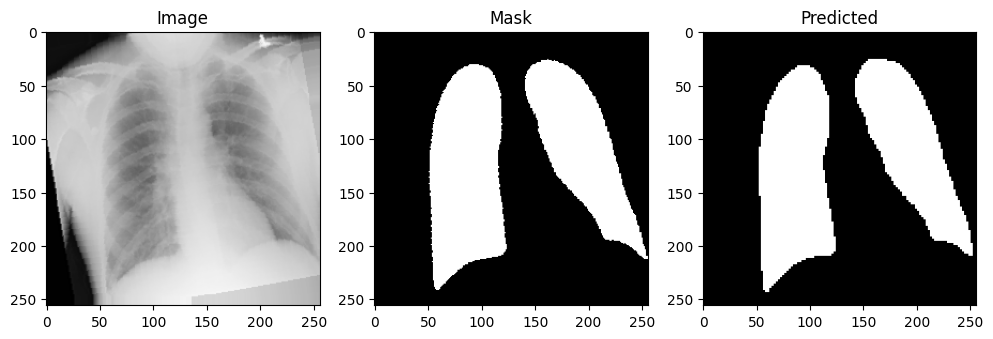

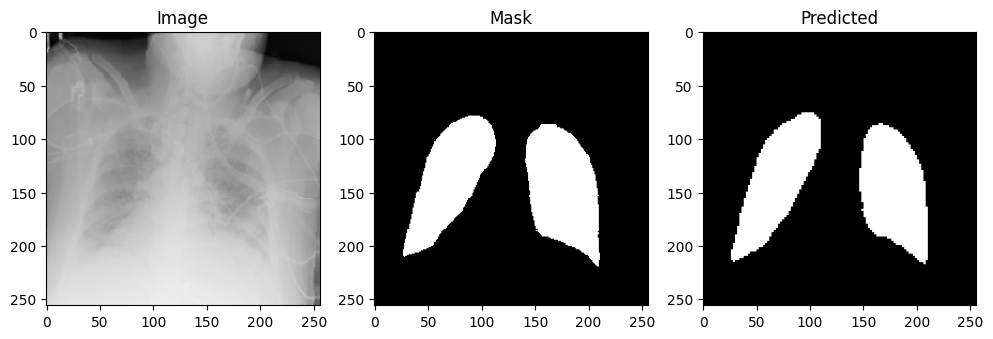

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 713s 134ms/step - accuracy: 0.9741 - binary_io_u_1: 0.8974 - dice_coefficient: 0.9229 - loss: 0.0661 - learning_rate: 0.0010
Epoch 2/50
5289/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9816 - binary_io_u_1: 0.9262 - dice_coefficient: 0.9446 - loss: 0.0455

2025-10-10 23:09:21.644637: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9816 - binary_io_u_1: 0.9262 - dice_coefficient: 0.9446 - loss: 0.0455
Epoch 2: dice_coefficient improved from 0.92289 to 0.94645, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


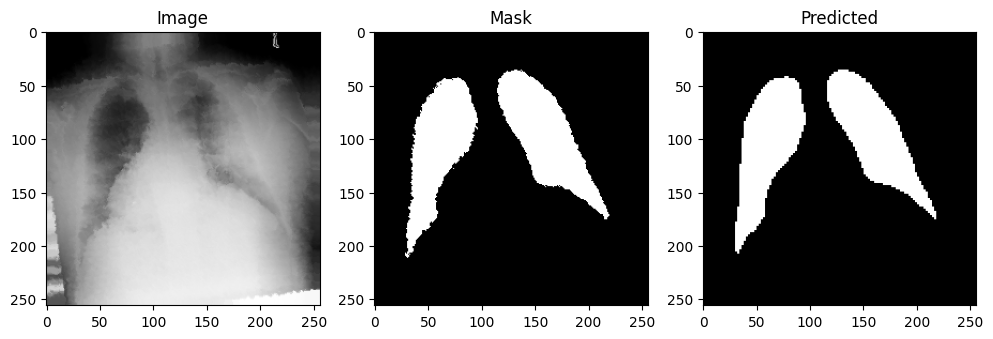

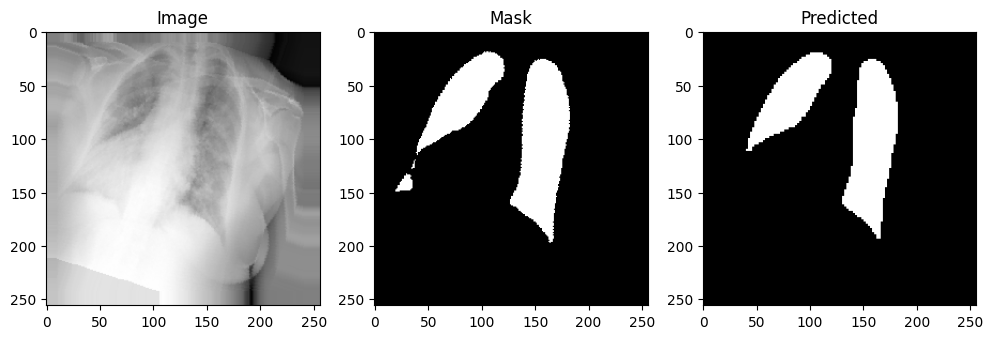

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 706s 133ms/step - accuracy: 0.9822 - binary_io_u_1: 0.9287 - dice_coefficient: 0.9464 - loss: 0.0439 - learning_rate: 0.0010
Epoch 3/50
5289/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9834 - binary_io_u_1: 0.9330 - dice_coefficient: 0.9497 - loss: 0.0409

2025-10-10 23:21:06.895161: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9834 - binary_io_u_1: 0.9331 - dice_coefficient: 0.9497 - loss: 0.0409
Epoch 3: dice_coefficient improved from 0.94645 to 0.95168, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


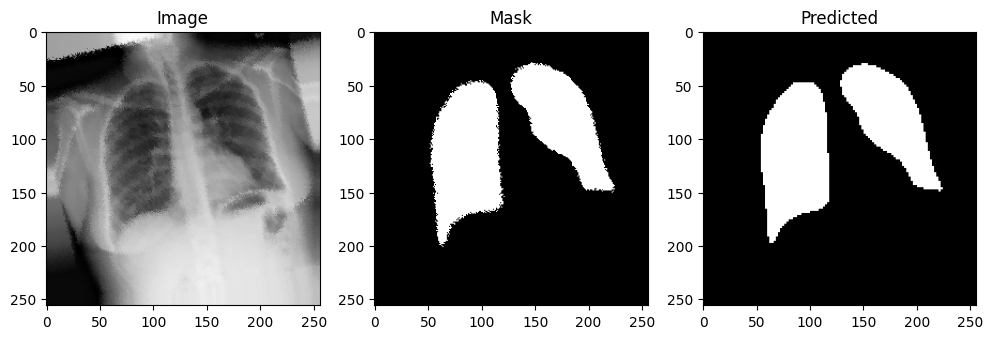

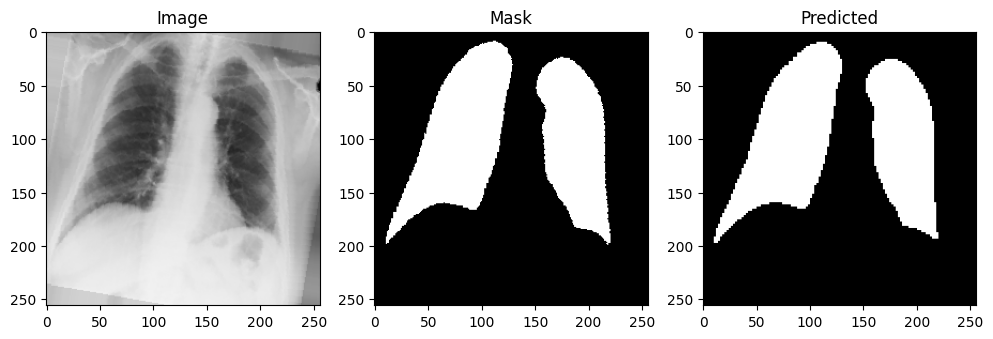

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 702s 133ms/step - accuracy: 0.9840 - binary_io_u_1: 0.9355 - dice_coefficient: 0.9517 - loss: 0.0390 - learning_rate: 0.0010
Epoch 4/50
5287/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9846 - binary_io_u_1: 0.9378 - dice_coefficient: 0.9535 - loss: 0.0374

2025-10-10 23:32:50.841113: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9846 - binary_io_u_1: 0.9378 - dice_coefficient: 0.9535 - loss: 0.0374
Epoch 4: dice_coefficient improved from 0.95168 to 0.95437, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


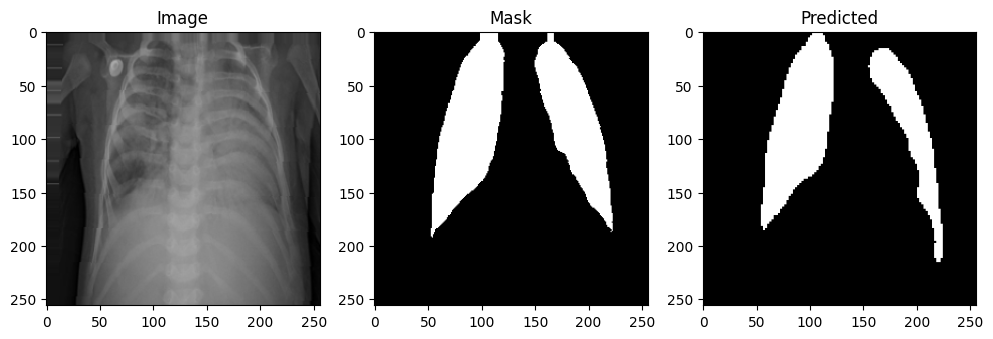

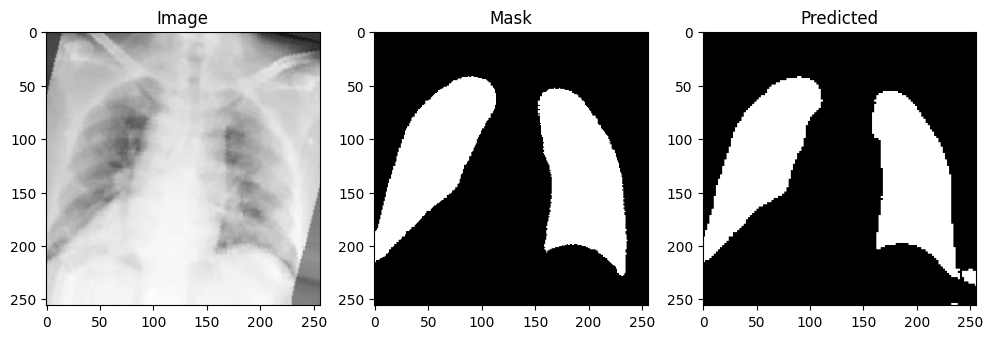

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 703s 133ms/step - accuracy: 0.9848 - binary_io_u_1: 0.9388 - dice_coefficient: 0.9544 - loss: 0.0366 - learning_rate: 0.0010
Epoch 5/50
5286/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9853 - binary_io_u_1: 0.9408 - dice_coefficient: 0.9561 - loss: 0.0351

2025-10-10 23:44:34.785039: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9853 - binary_io_u_1: 0.9408 - dice_coefficient: 0.9561 - loss: 0.0351
Epoch 5: dice_coefficient improved from 0.95437 to 0.95642, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


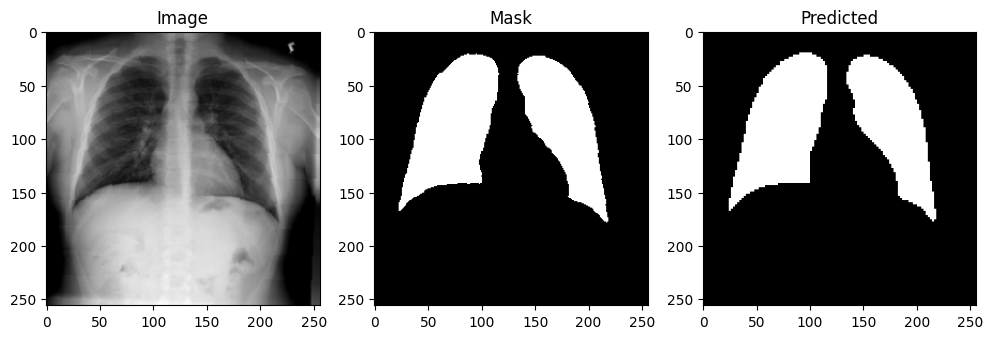

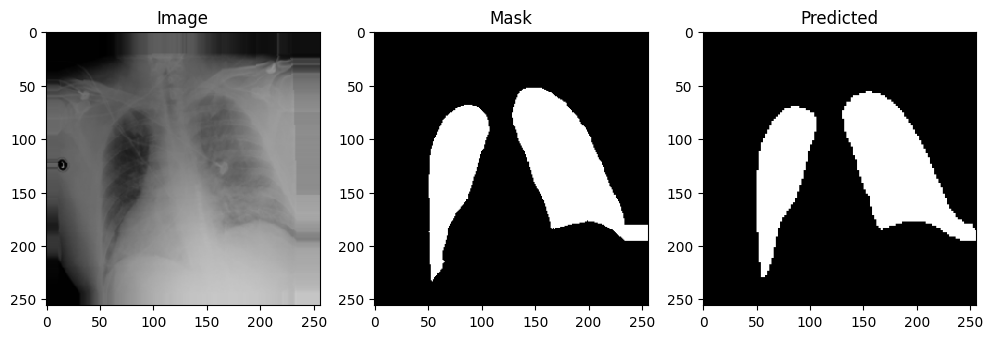

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 705s 133ms/step - accuracy: 0.9854 - binary_io_u_1: 0.9412 - dice_coefficient: 0.9564 - loss: 0.0348 - learning_rate: 0.0010
Epoch 6/50
5285/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9854 - binary_io_u_1: 0.9413 - dice_coefficient: 0.9564 - loss: 0.0348

2025-10-10 23:56:18.810580: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9854 - binary_io_u_1: 0.9413 - dice_coefficient: 0.9564 - loss: 0.0348
Epoch 6: dice_coefficient improved from 0.95642 to 0.95745, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


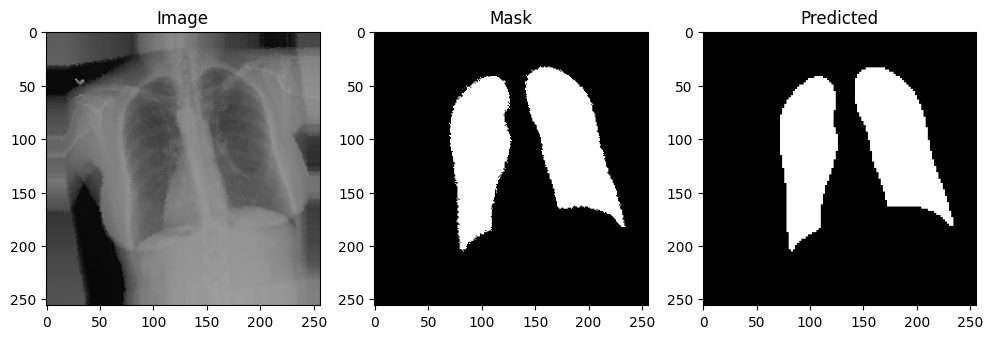

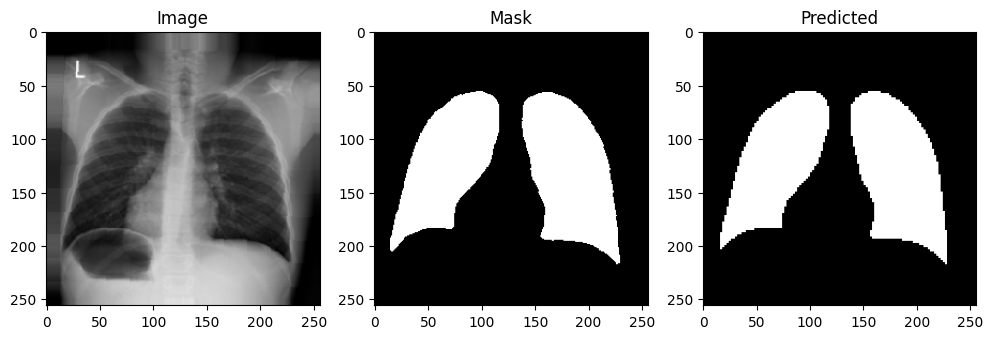

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 704s 133ms/step - accuracy: 0.9858 - binary_io_u_1: 0.9426 - dice_coefficient: 0.9575 - loss: 0.0339 - learning_rate: 0.0010
Epoch 7/50
5284/5292 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - accuracy: 0.9859 - binary_io_u_1: 0.9427 - dice_coefficient: 0.9575 - loss: 0.0337

2025-10-11 00:08:00.794934: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9859 - binary_io_u_1: 0.9427 - dice_coefficient: 0.9575 - loss: 0.0337
Epoch 7: dice_coefficient improved from 0.95745 to 0.95850, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


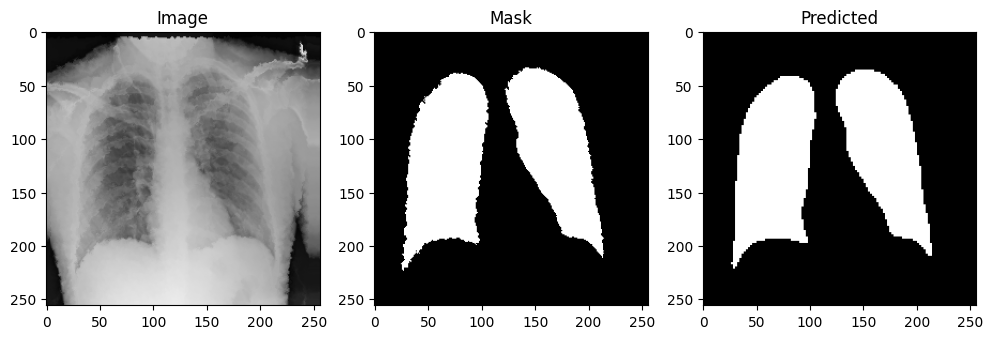

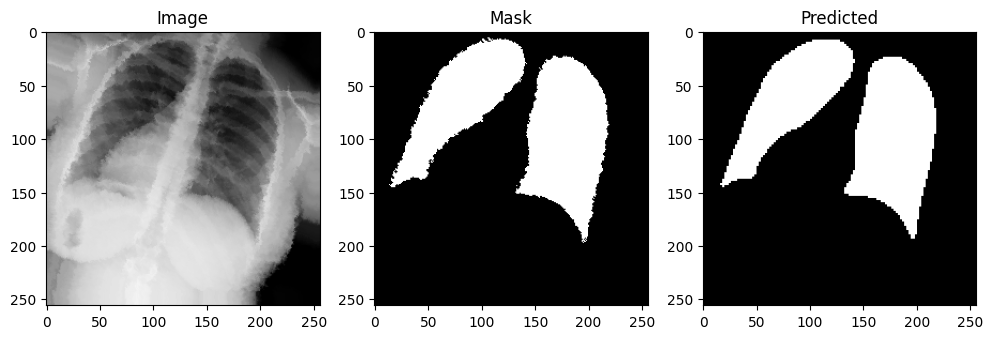

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 702s 133ms/step - accuracy: 0.9861 - binary_io_u_1: 0.9440 - dice_coefficient: 0.9585 - loss: 0.0329 - learning_rate: 0.0010
Epoch 8/50
5283/5292 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - accuracy: 0.9860 - binary_io_u_1: 0.9435 - dice_coefficient: 0.9581 - loss: 0.0333

2025-10-11 00:19:43.193906: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9860 - binary_io_u_1: 0.9435 - dice_coefficient: 0.9581 - loss: 0.0333
Epoch 8: dice_coefficient improved from 0.95850 to 0.95904, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


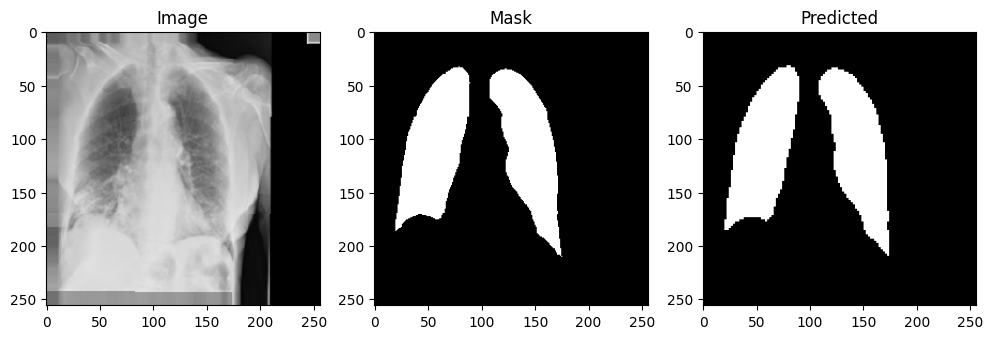

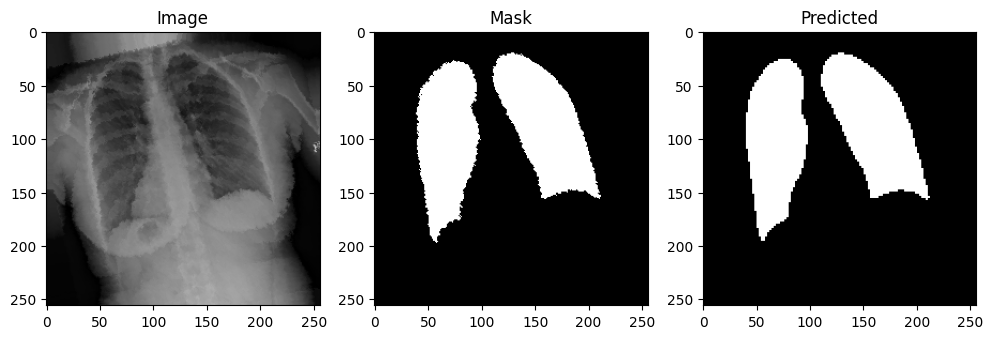

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 703s 133ms/step - accuracy: 0.9863 - binary_io_u_1: 0.9446 - dice_coefficient: 0.9590 - loss: 0.0325 - learning_rate: 0.0010
Epoch 9/50
5282/5292 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - accuracy: 0.9865 - binary_io_u_1: 0.9453 - dice_coefficient: 0.9596 - loss: 0.0320

2025-10-11 00:31:22.411750: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.9865 - binary_io_u_1: 0.9453 - dice_coefficient: 0.9596 - loss: 0.0320
Epoch 9: dice_coefficient improved from 0.95904 to 0.96006, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


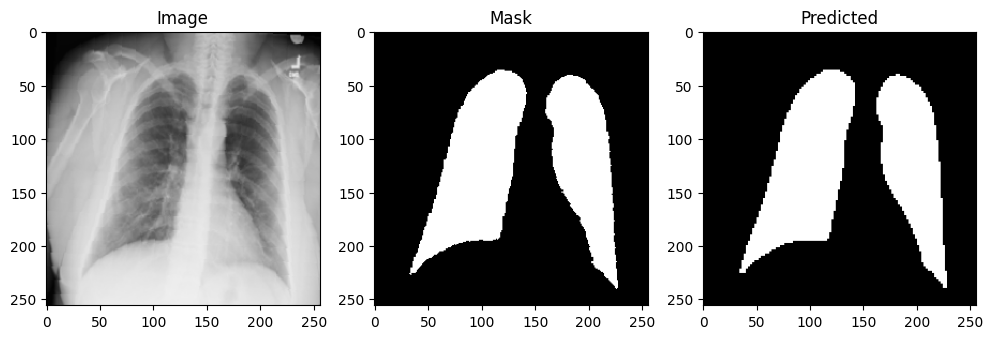

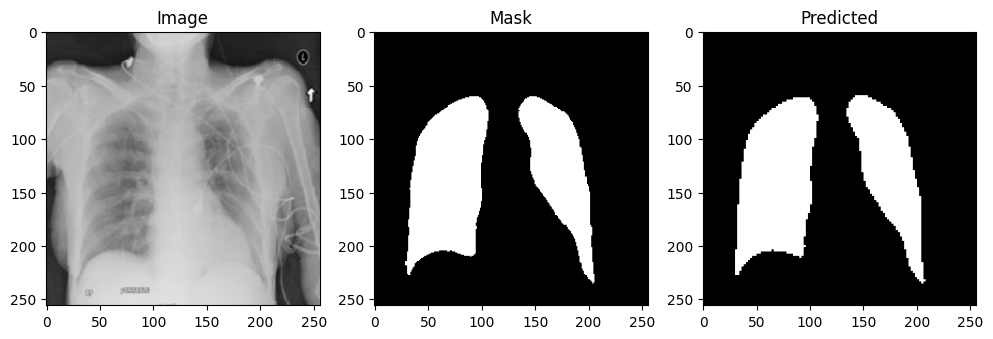

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 699s 132ms/step - accuracy: 0.9866 - binary_io_u_1: 0.9458 - dice_coefficient: 0.9601 - loss: 0.0316 - learning_rate: 0.0010
Epoch 10/50
5281/5292 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - accuracy: 0.9867 - binary_io_u_1: 0.9462 - dice_coefficient: 0.9603 - loss: 0.0313

2025-10-11 00:43:02.907329: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9867 - binary_io_u_1: 0.9462 - dice_coefficient: 0.9603 - loss: 0.0313
Epoch 10: dice_coefficient improved from 0.96006 to 0.96062, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


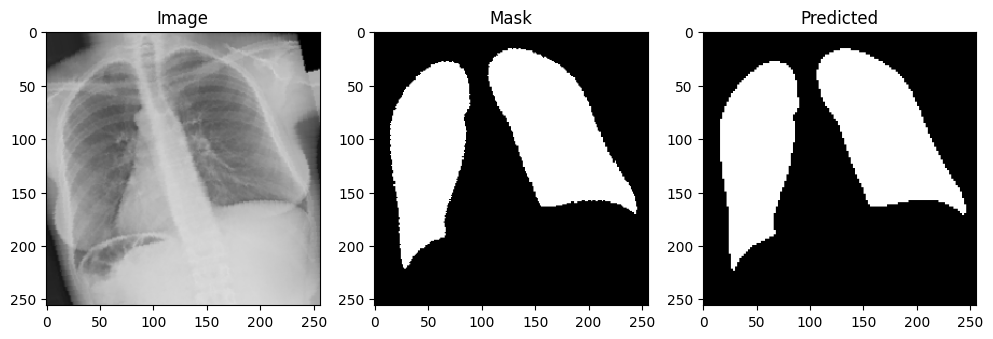

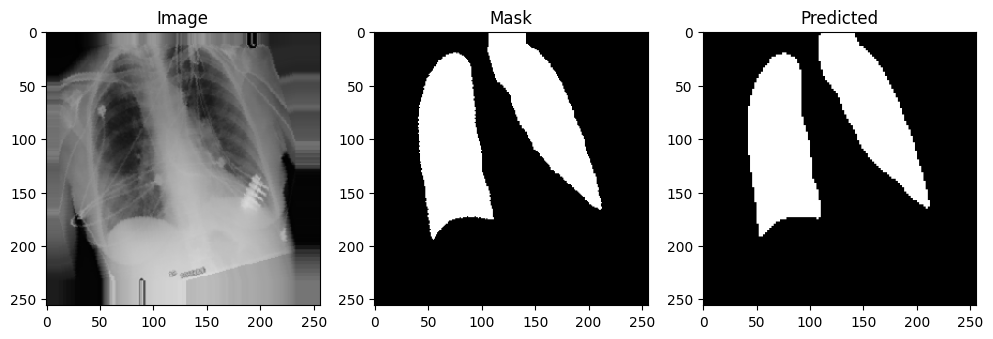

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 704s 133ms/step - accuracy: 0.9868 - binary_io_u_1: 0.9465 - dice_coefficient: 0.9606 - loss: 0.0311 - learning_rate: 0.0010
Epoch 11/50
5280/5292 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - accuracy: 0.9867 - binary_io_u_1: 0.9461 - dice_coefficient: 0.9604 - loss: 0.0312

2025-10-11 00:54:45.403658: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.9867 - binary_io_u_1: 0.9461 - dice_coefficient: 0.9604 - loss: 0.0312
Epoch 11: dice_coefficient improved from 0.96062 to 0.96081, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


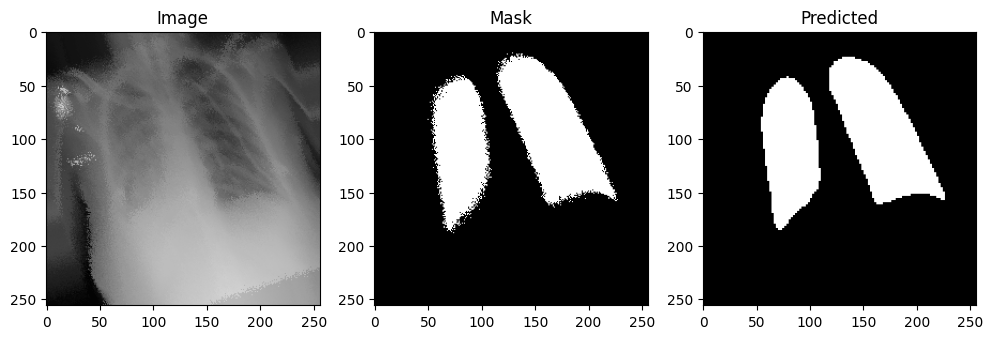

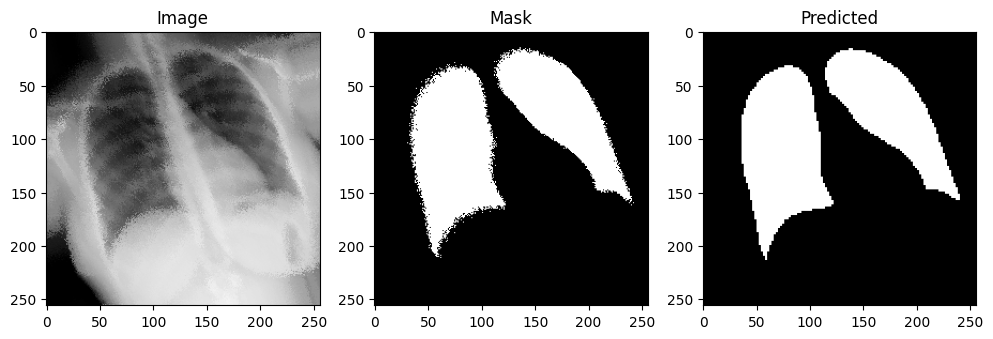

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 700s 132ms/step - accuracy: 0.9868 - binary_io_u_1: 0.9467 - dice_coefficient: 0.9608 - loss: 0.0309 - learning_rate: 0.0010
Epoch 12/50
5279/5292 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - accuracy: 0.9869 - binary_io_u_1: 0.9470 - dice_coefficient: 0.9609 - loss: 0.0308

2025-10-11 01:06:25.604569: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9869 - binary_io_u_1: 0.9470 - dice_coefficient: 0.9609 - loss: 0.0308
Epoch 12: dice_coefficient improved from 0.96081 to 0.96133, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


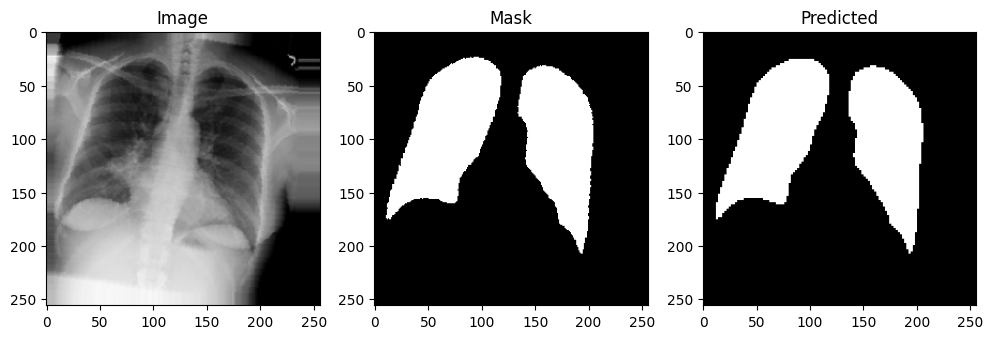

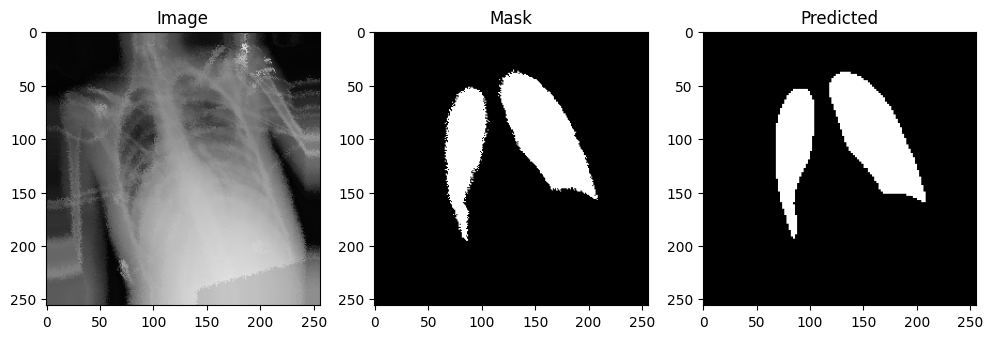

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 700s 132ms/step - accuracy: 0.9870 - binary_io_u_1: 0.9475 - dice_coefficient: 0.9613 - loss: 0.0303 - learning_rate: 0.0010
Epoch 13/50
5278/5292 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - accuracy: 0.9869 - binary_io_u_1: 0.9471 - dice_coefficient: 0.9611 - loss: 0.0306

2025-10-11 01:18:05.679424: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9869 - binary_io_u_1: 0.9471 - dice_coefficient: 0.9611 - loss: 0.0306
Epoch 13: dice_coefficient improved from 0.96133 to 0.96160, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


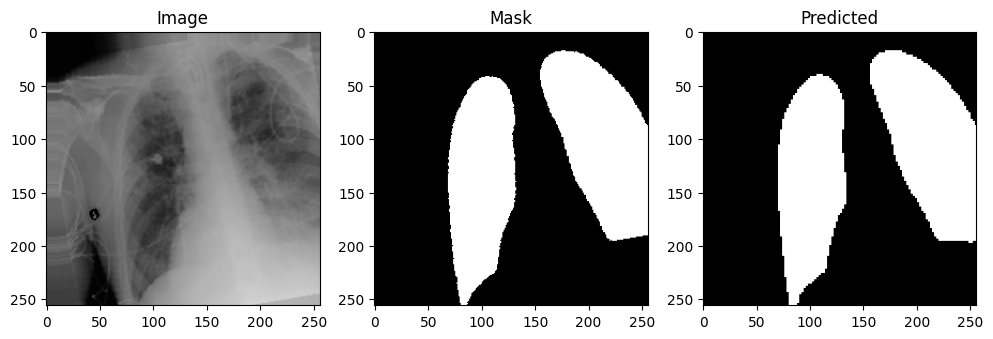

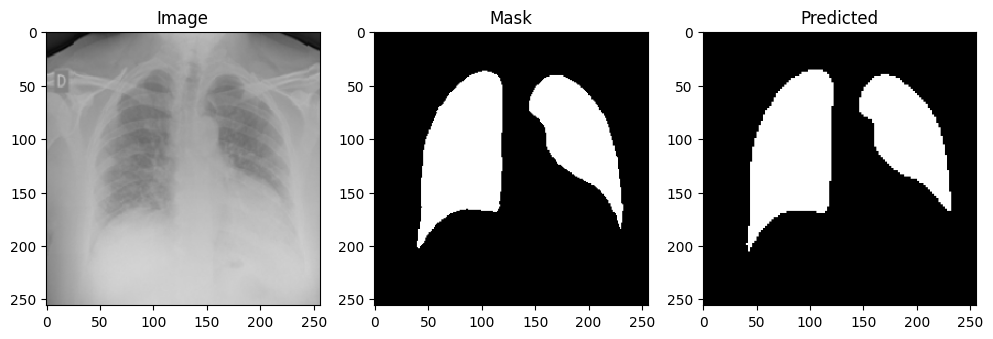

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 700s 132ms/step - accuracy: 0.9871 - binary_io_u_1: 0.9477 - dice_coefficient: 0.9616 - loss: 0.0302 - learning_rate: 0.0010
Epoch 14/50
5277/5292 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - accuracy: 0.9871 - binary_io_u_1: 0.9477 - dice_coefficient: 0.9616 - loss: 0.0301

2025-10-11 01:29:43.217390: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.9871 - binary_io_u_1: 0.9477 - dice_coefficient: 0.9616 - loss: 0.0301
Epoch 14: dice_coefficient improved from 0.96160 to 0.96196, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


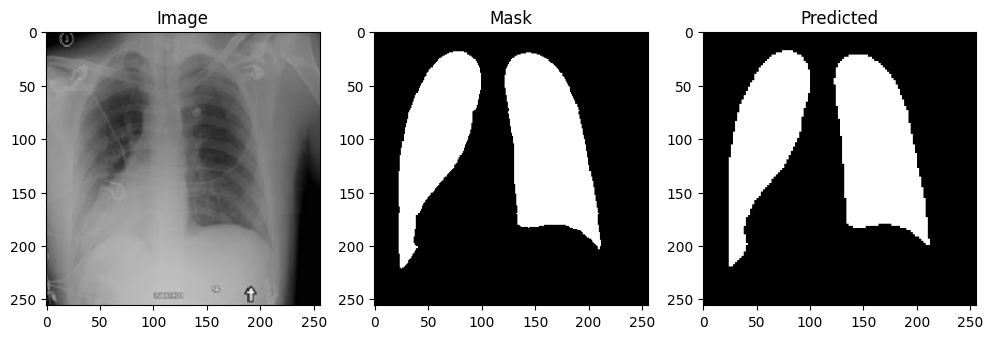

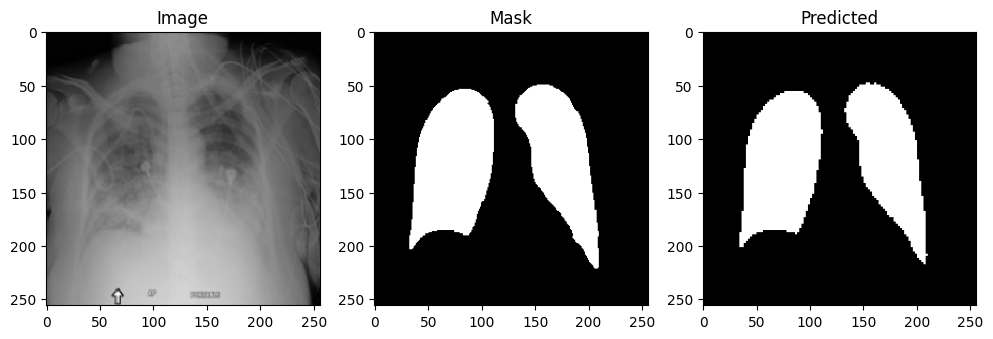

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 699s 132ms/step - accuracy: 0.9872 - binary_io_u_1: 0.9482 - dice_coefficient: 0.9620 - loss: 0.0298 - learning_rate: 0.0010
Epoch 15/50
5276/5292 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - accuracy: 0.9872 - binary_io_u_1: 0.9481 - dice_coefficient: 0.9619 - loss: 0.0298

2025-10-11 01:41:23.373853: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.9872 - binary_io_u_1: 0.9481 - dice_coefficient: 0.9619 - loss: 0.0298
Epoch 15: dice_coefficient improved from 0.96196 to 0.96224, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


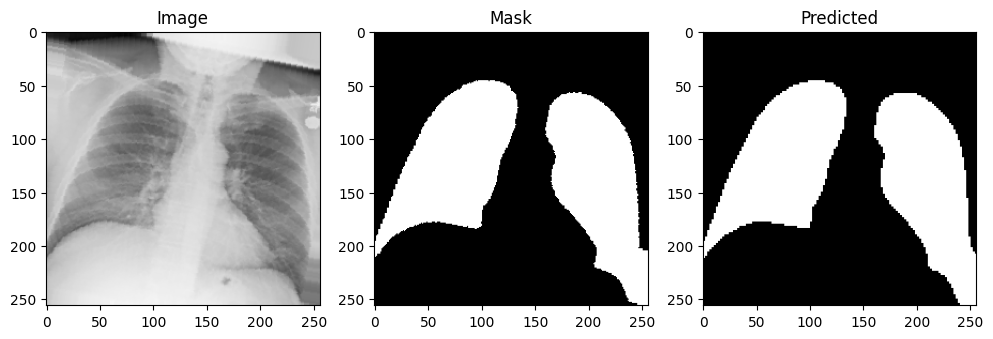

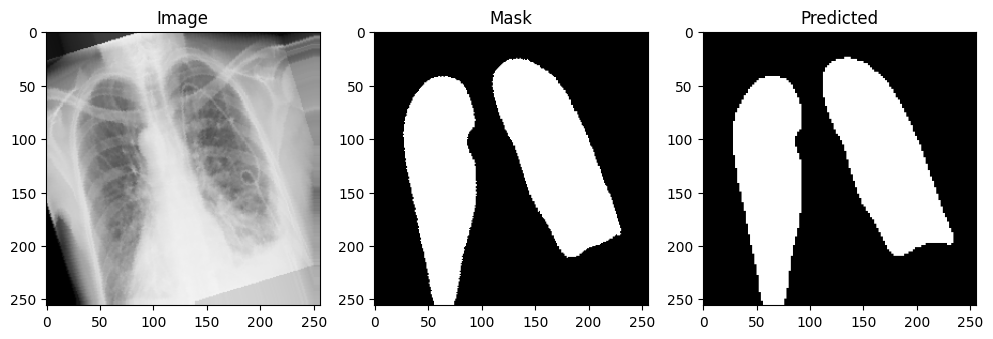

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 700s 132ms/step - accuracy: 0.9873 - binary_io_u_1: 0.9486 - dice_coefficient: 0.9622 - loss: 0.0296 - learning_rate: 0.0010
Epoch 16/50
5275/5292 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - accuracy: 0.9872 - binary_io_u_1: 0.9483 - dice_coefficient: 0.9621 - loss: 0.0298

2025-10-11 01:53:03.428778: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9872 - binary_io_u_1: 0.9483 - dice_coefficient: 0.9621 - loss: 0.0298
Epoch 16: dice_coefficient improved from 0.96224 to 0.96255, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step

2025-10-11 01:53:08.532248: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


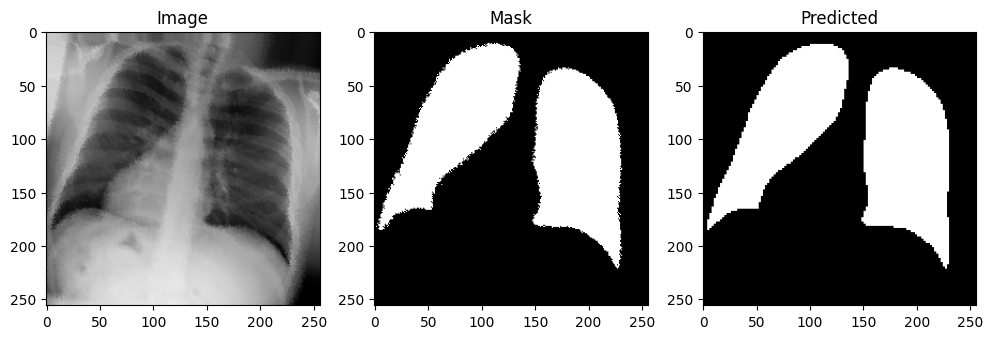

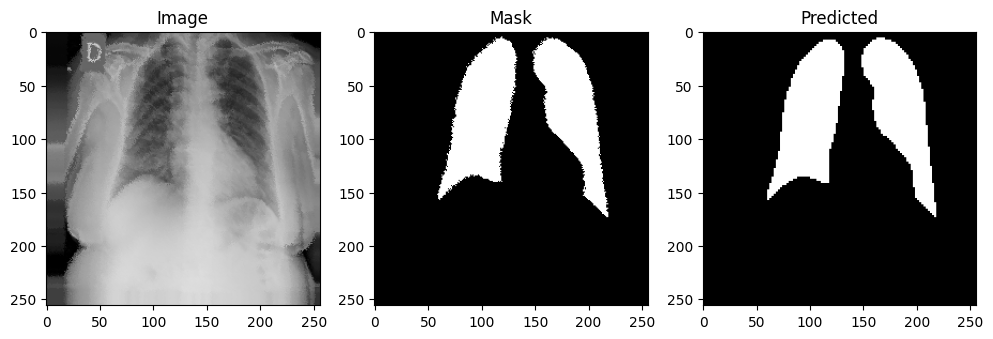

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 700s 132ms/step - accuracy: 0.9874 - binary_io_u_1: 0.9490 - dice_coefficient: 0.9625 - loss: 0.0294 - learning_rate: 0.0010
Epoch 17/50
5274/5292 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - accuracy: 0.9874 - binary_io_u_1: 0.9489 - dice_coefficient: 0.9625 - loss: 0.0293

2025-10-11 02:04:40.566928: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.9874 - binary_io_u_1: 0.9489 - dice_coefficient: 0.9625 - loss: 0.0293
Epoch 17: dice_coefficient improved from 0.96255 to 0.96268, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


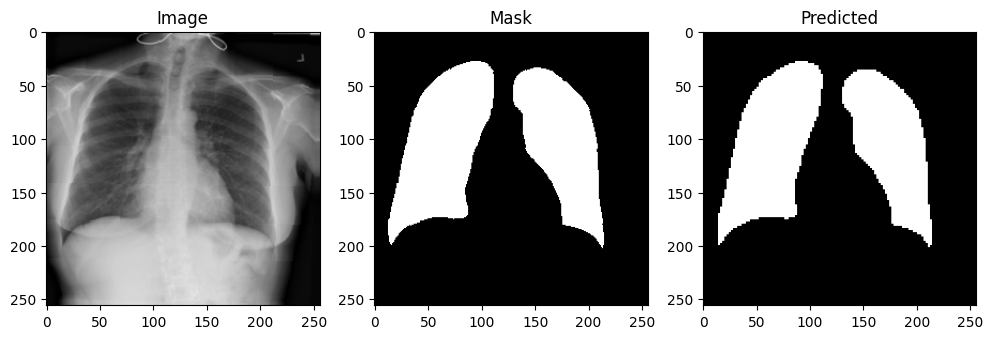

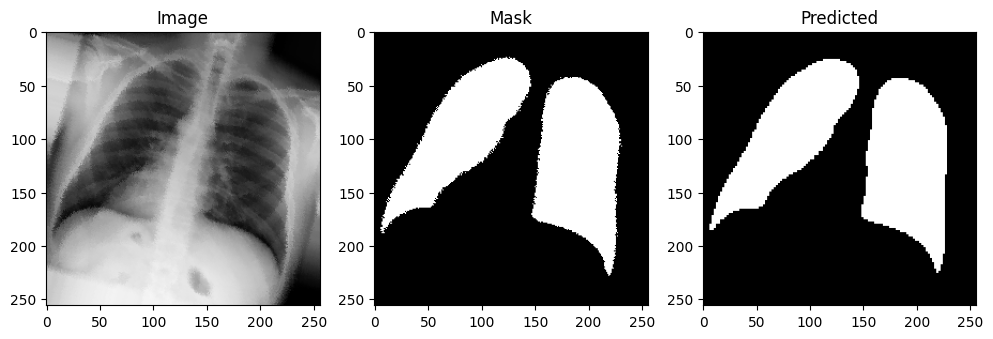

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 698s 132ms/step - accuracy: 0.9874 - binary_io_u_1: 0.9491 - dice_coefficient: 0.9627 - loss: 0.0292 - learning_rate: 0.0010
Epoch 18/50
5273/5292 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - accuracy: 0.9874 - binary_io_u_1: 0.9492 - dice_coefficient: 0.9627 - loss: 0.0293

2025-10-11 02:16:19.731891: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.9874 - binary_io_u_1: 0.9492 - dice_coefficient: 0.9627 - loss: 0.0293
Epoch 18: dice_coefficient improved from 0.96268 to 0.96316, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


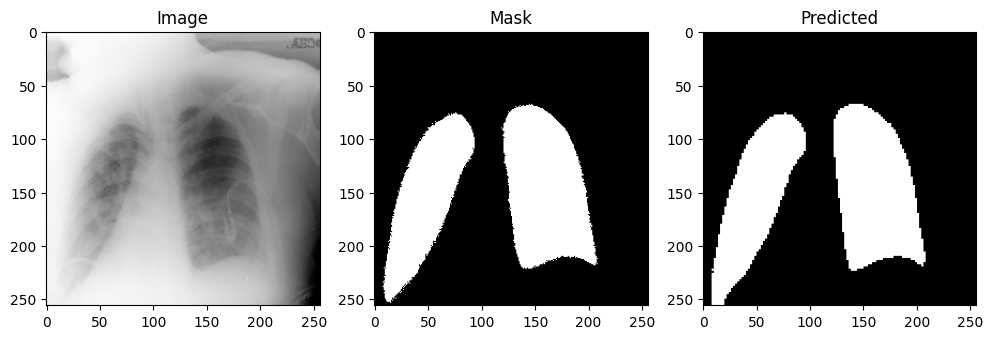

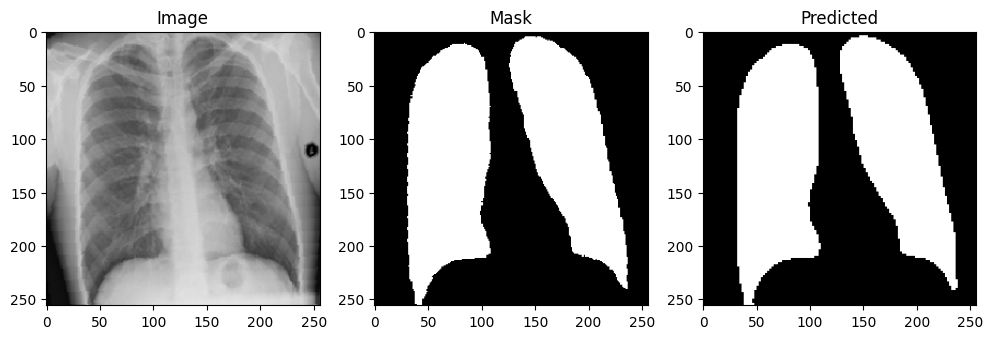

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 699s 132ms/step - accuracy: 0.9876 - binary_io_u_1: 0.9498 - dice_coefficient: 0.9632 - loss: 0.0289 - learning_rate: 0.0010
Epoch 19/50
5272/5292 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - accuracy: 0.9875 - binary_io_u_1: 0.9493 - dice_coefficient: 0.9628 - loss: 0.0290

2025-10-11 02:28:00.996278: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9875 - binary_io_u_1: 0.9493 - dice_coefficient: 0.9628 - loss: 0.0290
Epoch 19: dice_coefficient did not improve from 0.96316
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


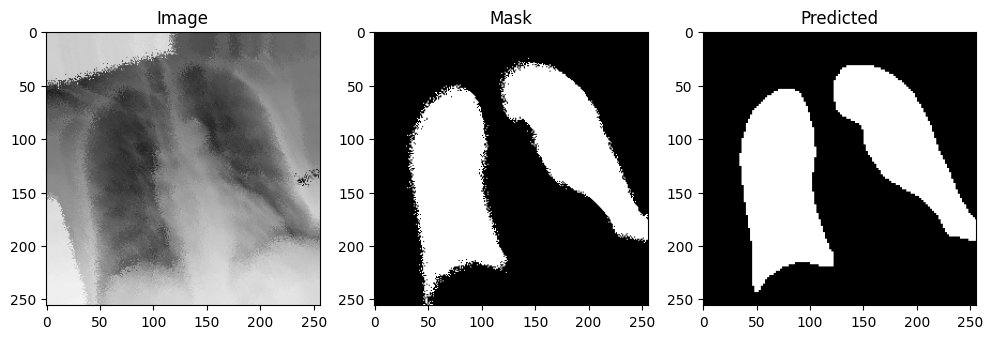

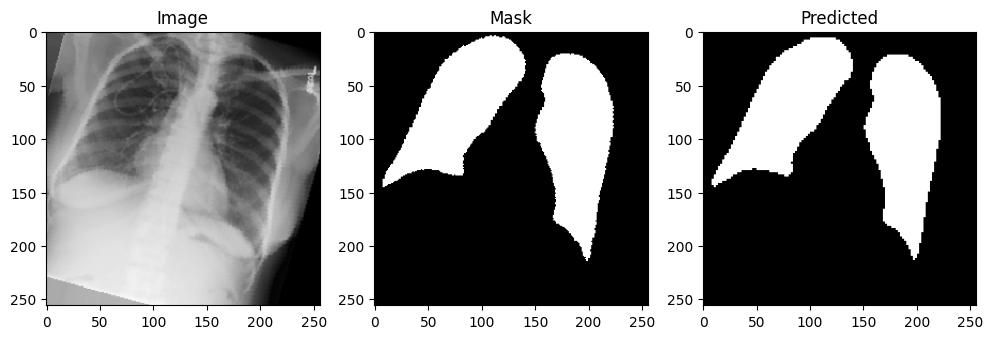

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 705s 133ms/step - accuracy: 0.9875 - binary_io_u_1: 0.9495 - dice_coefficient: 0.9630 - loss: 0.0289 - learning_rate: 0.0010
Epoch 20/50
5271/5292 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - accuracy: 0.9876 - binary_io_u_1: 0.9497 - dice_coefficient: 0.9632 - loss: 0.0288

2025-10-11 02:39:46.254694: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9876 - binary_io_u_1: 0.9497 - dice_coefficient: 0.9632 - loss: 0.0288
Epoch 20: dice_coefficient improved from 0.96316 to 0.96346, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step


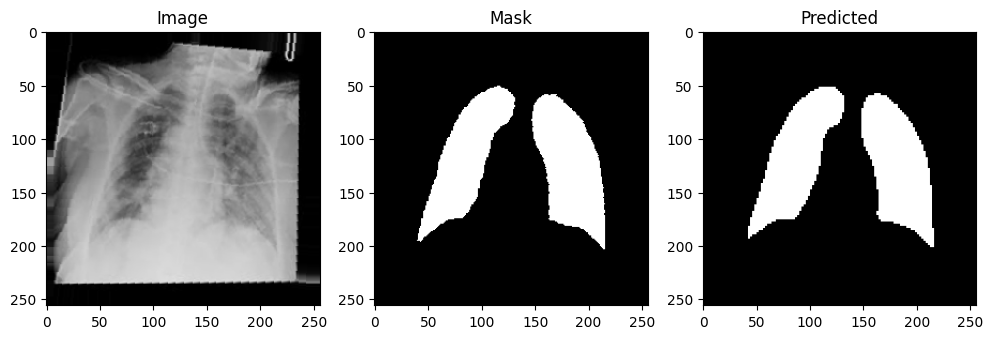

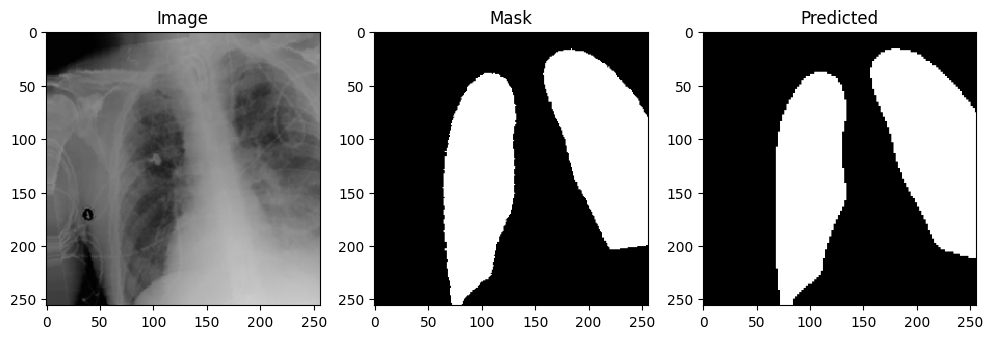

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 704s 133ms/step - accuracy: 0.9877 - binary_io_u_1: 0.9501 - dice_coefficient: 0.9635 - loss: 0.0285 - learning_rate: 0.0010
Epoch 21/50
5270/5292 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - accuracy: 0.9877 - binary_io_u_1: 0.9502 - dice_coefficient: 0.9635 - loss: 0.0285

2025-10-11 02:51:29.879527: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9877 - binary_io_u_1: 0.9502 - dice_coefficient: 0.9635 - loss: 0.0285
Epoch 21: dice_coefficient improved from 0.96346 to 0.96370, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


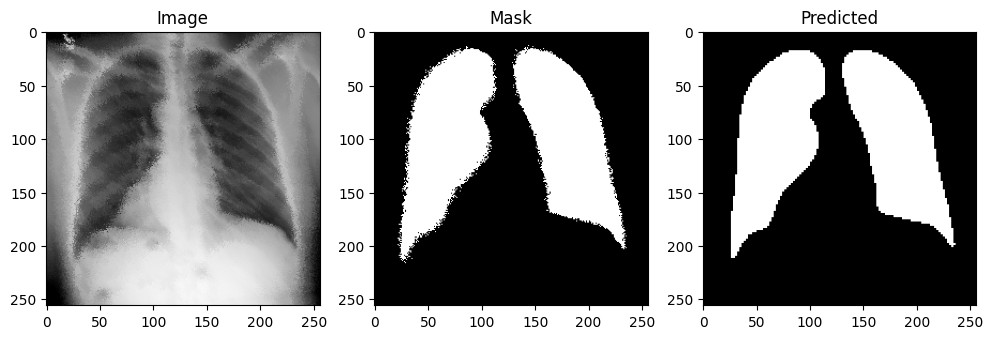

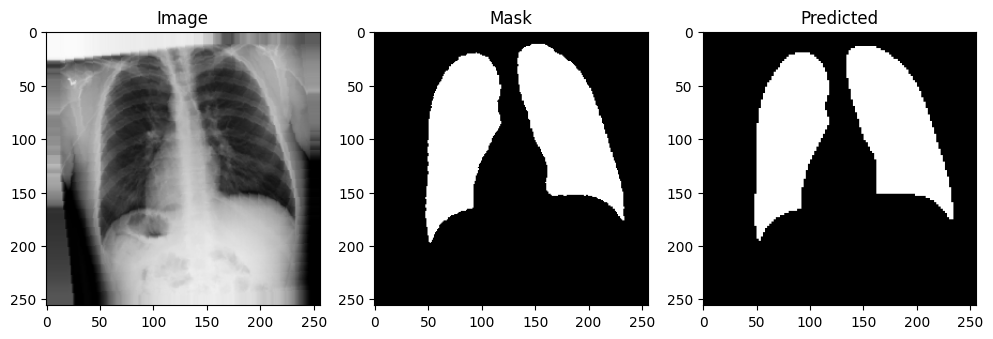

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 702s 133ms/step - accuracy: 0.9878 - binary_io_u_1: 0.9505 - dice_coefficient: 0.9637 - loss: 0.0282 - learning_rate: 0.0010
Epoch 22/50
5269/5292 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - accuracy: 0.9877 - binary_io_u_1: 0.9499 - dice_coefficient: 0.9634 - loss: 0.0287

2025-10-11 03:03:12.700488: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9877 - binary_io_u_1: 0.9499 - dice_coefficient: 0.9634 - loss: 0.0287
Epoch 22: dice_coefficient improved from 0.96370 to 0.96391, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


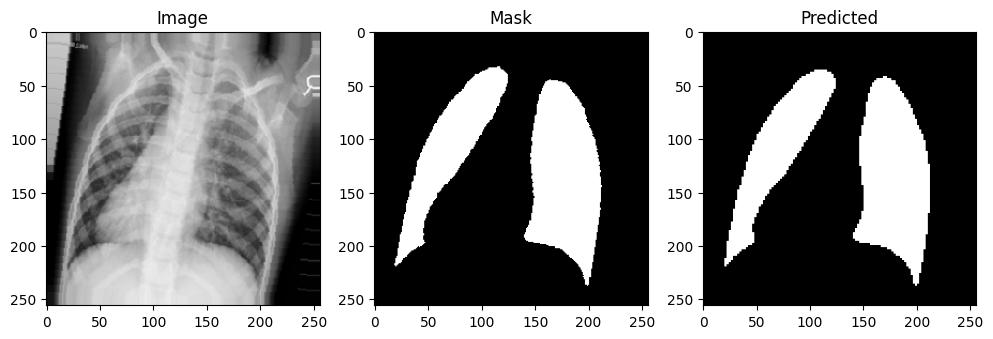

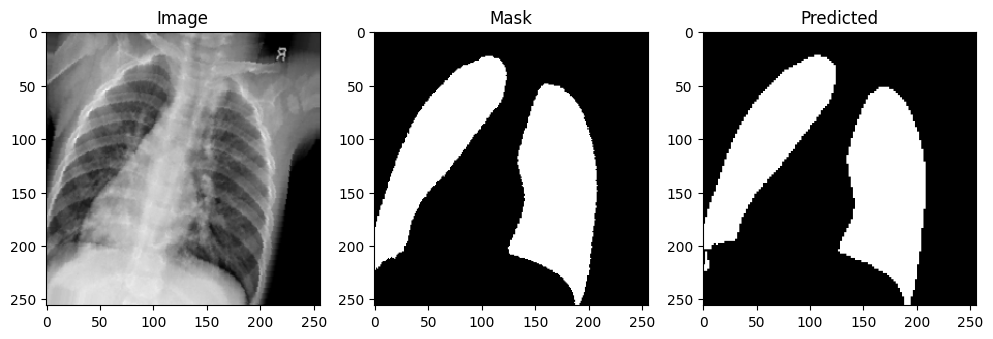

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 705s 133ms/step - accuracy: 0.9878 - binary_io_u_1: 0.9506 - dice_coefficient: 0.9639 - loss: 0.0282 - learning_rate: 0.0010
Epoch 23/50
5268/5292 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - accuracy: 0.9876 - binary_io_u_1: 0.9499 - dice_coefficient: 0.9633 - loss: 0.0288

2025-10-11 03:16:06.070792: W tensorflow/core/kernels/data/prefetch_autotuner.cc:55] Prefetch autotuner tried to allocate 4194304 bytes after encountering the first element of size 4194304 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accuracy: 0.9876 - binary_io_u_1: 0.9499 - dice_coefficient: 0.9633 - loss: 0.0288
Epoch 23: dice_coefficient did not improve from 0.96391
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


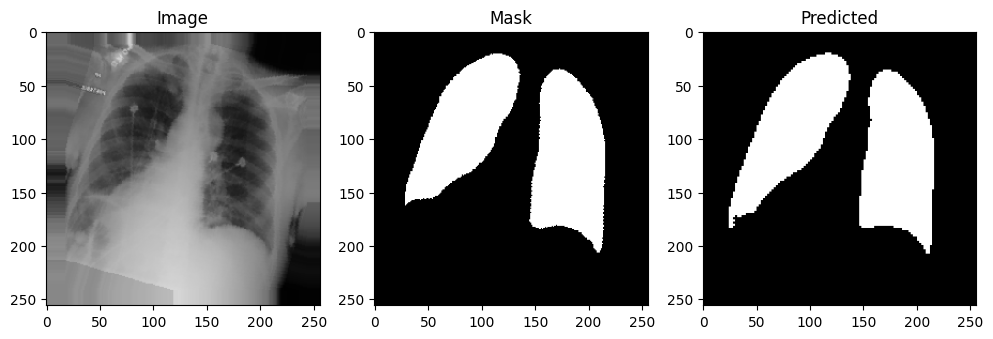

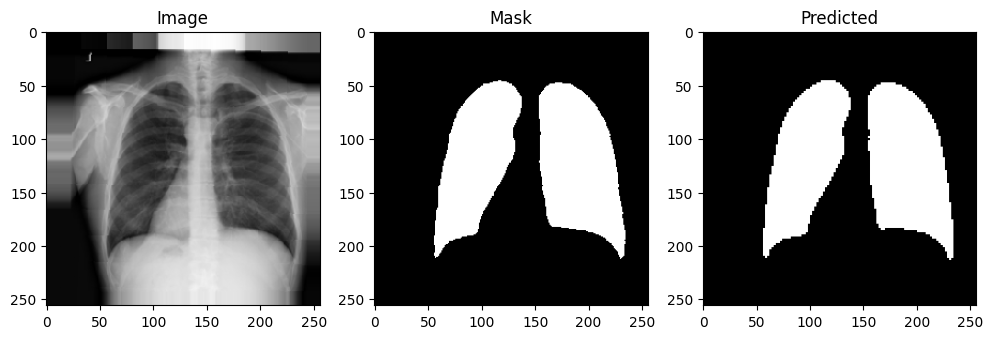

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 782s 148ms/step - accuracy: 0.9878 - binary_io_u_1: 0.9506 - dice_coefficient: 0.9638 - loss: 0.0283 - learning_rate: 0.0010
Epoch 24/50
   2/5292 ━━━━━━━━━━━━━━━━━━━━ 47:16:04 32s/step - accuracy: 0.9903 - binary_io_u_1: 0.9651 - dice_coefficient: 0.9730 - loss: 0.0224

In [ ]:
# train the model
NUM_EPOCHS = 50
history = model.fit(
    train_dataset.repeat(),
    epochs= NUM_EPOCHS,
    steps_per_epoch= steps_per_epoch,
    callbacks= callbacks
)

### 6.2 Training Continuation Strategy

It is noted that the initial training run was interrupted (e.g., terminal crash) at **Epoch 24**. The use of the `ModelCheckpoint` and `EarlyStopping` callbacks enables a robust strategy for resuming training without losing progress.

* **Resumption Method:** To continue training manually from the point of interruption, the following steps were taken:
    1.  **Loading the Best Model:** The weights corresponding to the best performance achieved *before* the crash were loaded from the saved checkpoint file (`./models/segmentation/best_segmentation_model.keras`).
    2.  **Continuing `model.fit`:** The `model.fit` command was re-executed. Keras continues the optimization process from the loaded weights, ensuring that training continues towards convergence rather than restarting from random initialization.
    3.  **Callback Management:** The `EarlyStopping` and `ReduceLROnPlateau` callbacks inherently managed the continuation, resetting their internal counters (patience) but maintaining the historical best metric achieved so far.

This methodology ensures efficient use of compute resources and preserves the model's highest achieved segmentation quality.

In [23]:
# loading previous model to continue training
with strategy.scope():
    model = tf.keras.models.load_model(
    './models/segmentation/best_segmentation_model.keras',
    custom_objects={'dice_coefficient': dice_coefficient}
    )
    loss = tf.keras.losses.BinaryCrossentropy()
    model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate= LEARNING_RATE),
    loss = loss,
    metrics = ['accuracy', dice_coefficient, iou]
    )

2025-10-13 19:36:36.857964: E tensorflow/core/util/util.cc:131] oneDNN supports DT_INT32 only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Redu

2025-10-13 19:36:47.429905: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91300


5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.9878 - binary_io_u_1: 0.9503 - dice_coefficient: 0.9636 - loss: 0.0284INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).

Epoch 25: dice_coefficient improved from None to 0.96379, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


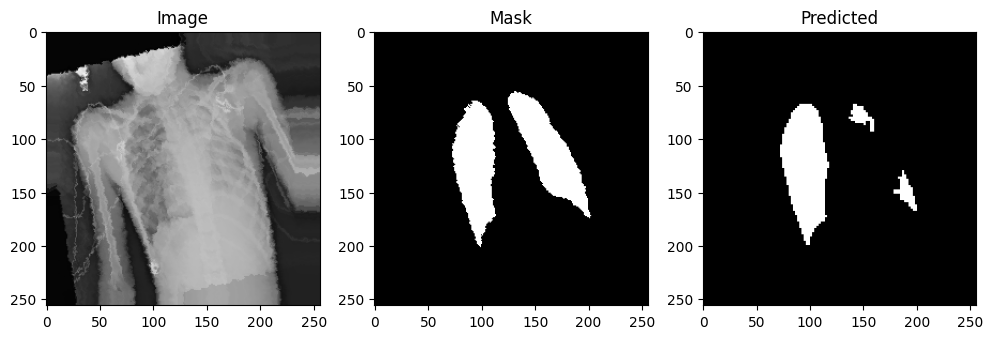

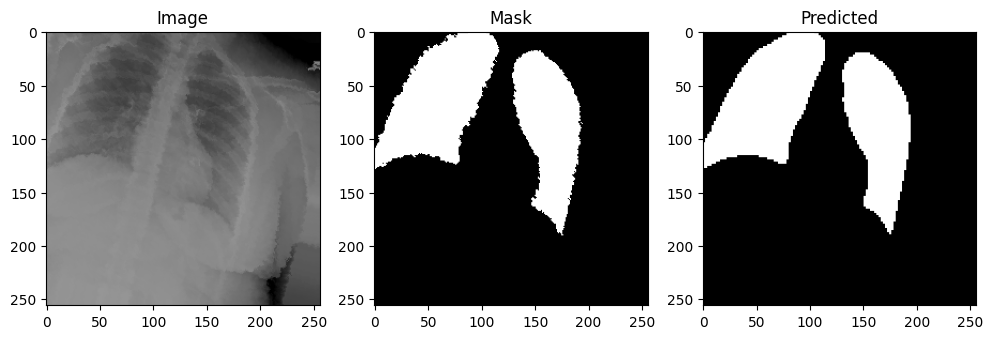

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 734s 136ms/step - accuracy: 0.9878 - binary_io_u_1: 0.9506 - dice_coefficient: 0.9638 - loss: 0.0282 - learning_rate: 0.0010
Epoch 26/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.9877 - binary_io_u_1: 0.9502 - dice_coefficient: 0.9635 - loss: 0.0284
Epoch 26: dice_coefficient improved from 0.96379 to 0.96405, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 744ms/step


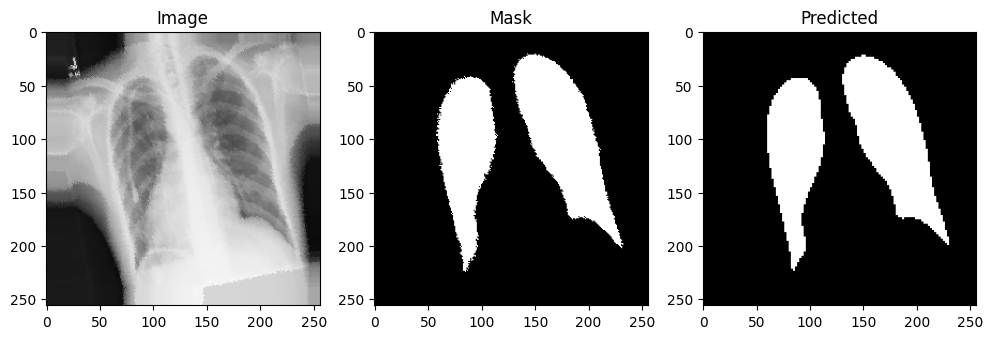

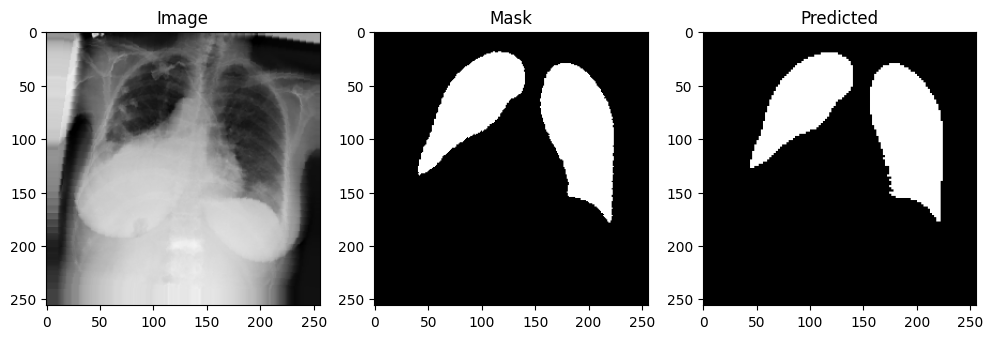

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 720s 136ms/step - accuracy: 0.9879 - binary_io_u_1: 0.9508 - dice_coefficient: 0.9640 - loss: 0.0280 - learning_rate: 0.0010
Epoch 27/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.9878 - binary_io_u_1: 0.9505 - dice_coefficient: 0.9638 - loss: 0.0282
Epoch 27: dice_coefficient improved from 0.96405 to 0.96407, saving model to ./models/segmentation/best_segmentation_model.keras


2025-10-13 20:12:46.519829: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 696ms/step


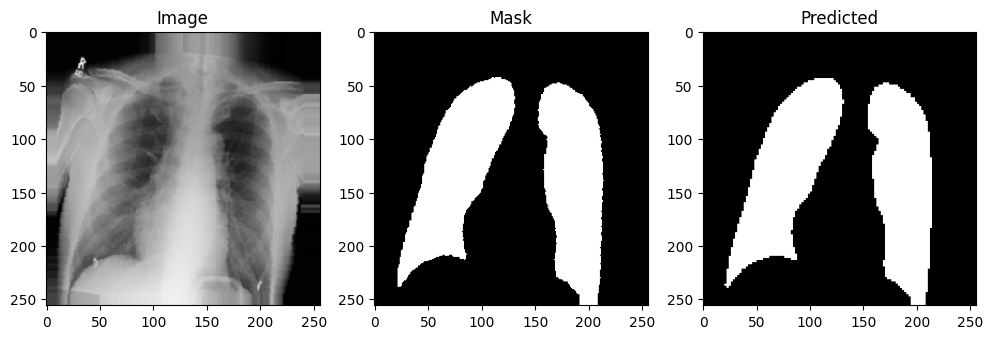

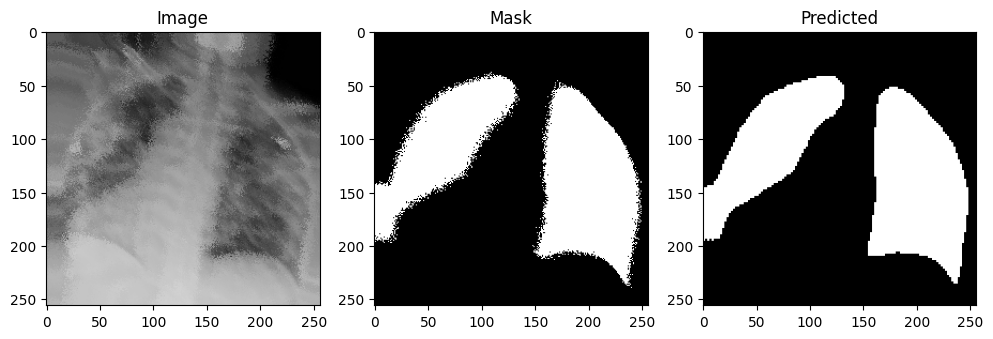

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 714s 135ms/step - accuracy: 0.9879 - binary_io_u_1: 0.9509 - dice_coefficient: 0.9641 - loss: 0.0280 - learning_rate: 0.0010
Epoch 28/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.9878 - binary_io_u_1: 0.9507 - dice_coefficient: 0.9639 - loss: 0.0281
Epoch 28: dice_coefficient improved from 0.96407 to 0.96433, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


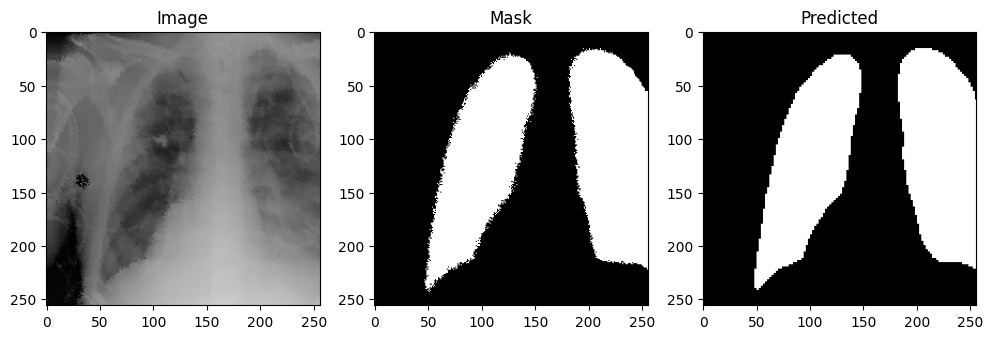

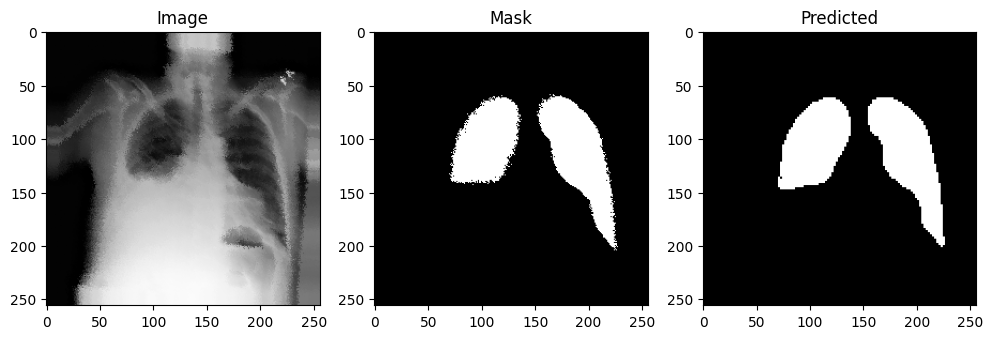

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 730s 138ms/step - accuracy: 0.9880 - binary_io_u_1: 0.9512 - dice_coefficient: 0.9643 - loss: 0.0278 - learning_rate: 0.0010
Epoch 29/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.9878 - binary_io_u_1: 0.9506 - dice_coefficient: 0.9639 - loss: 0.0282
Epoch 29: dice_coefficient improved from 0.96433 to 0.96436, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 842ms/step


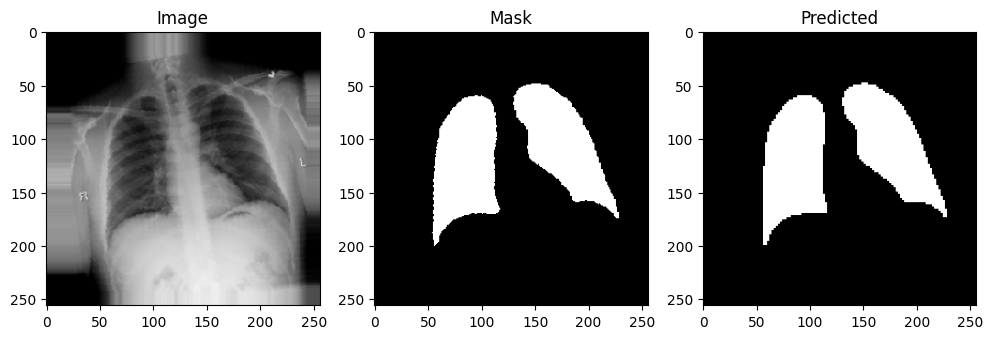

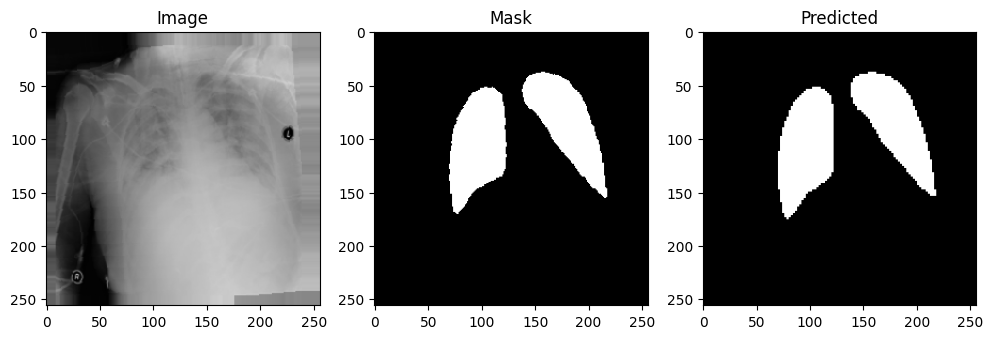

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 738s 140ms/step - accuracy: 0.9880 - binary_io_u_1: 0.9513 - dice_coefficient: 0.9644 - loss: 0.0278 - learning_rate: 0.0010
Epoch 30/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.9879 - binary_io_u_1: 0.9509 - dice_coefficient: 0.9642 - loss: 0.0279
Epoch 30: dice_coefficient improved from 0.96436 to 0.96449, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


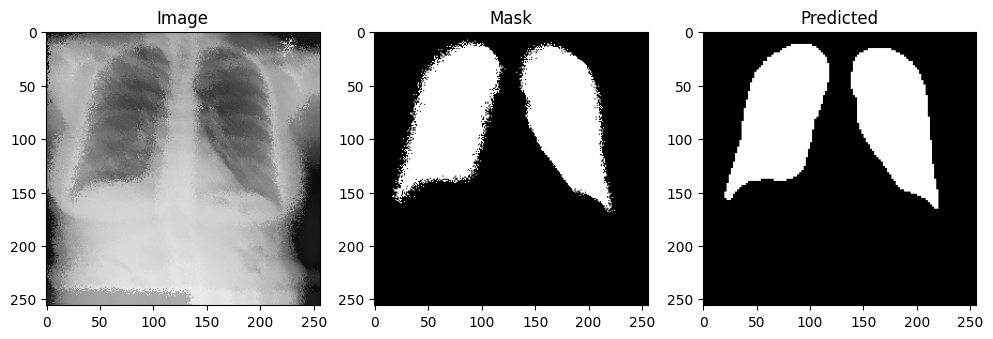

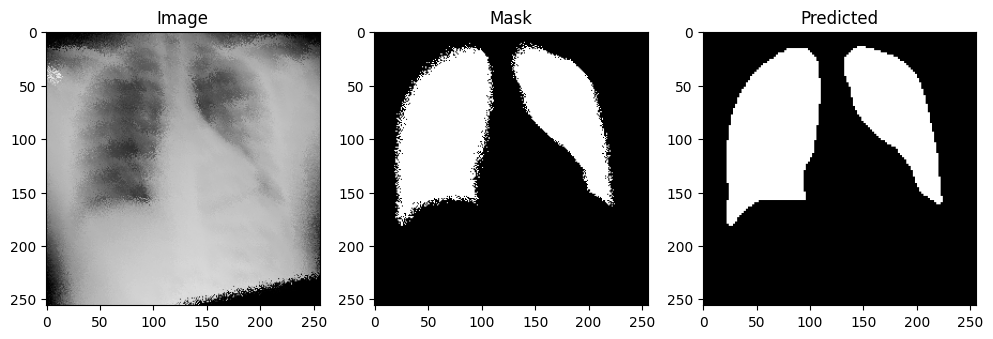

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 732s 138ms/step - accuracy: 0.9880 - binary_io_u_1: 0.9515 - dice_coefficient: 0.9645 - loss: 0.0276 - learning_rate: 0.0010
Epoch 31/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.9880 - binary_io_u_1: 0.9514 - dice_coefficient: 0.9644 - loss: 0.0276
Epoch 31: dice_coefficient improved from 0.96449 to 0.96455, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step


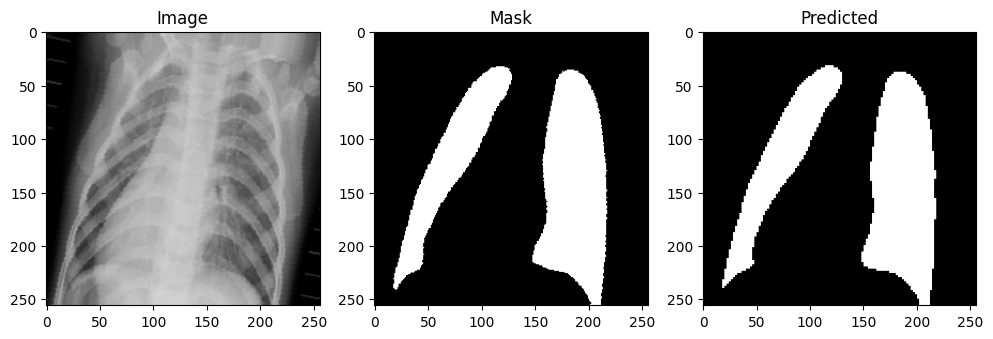

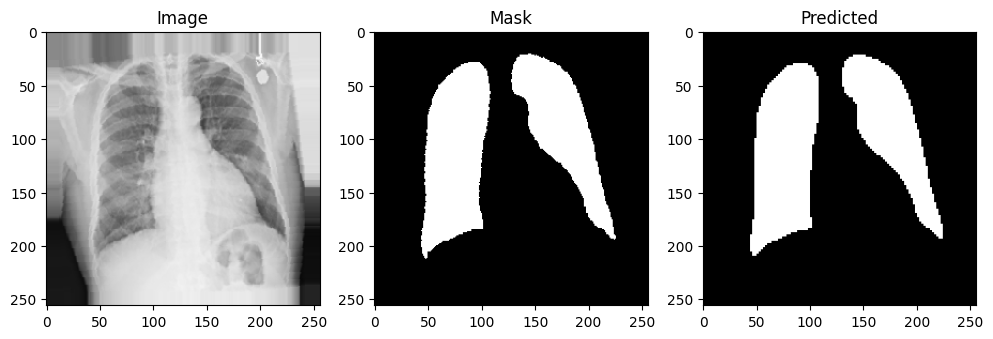

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 728s 137ms/step - accuracy: 0.9881 - binary_io_u_1: 0.9515 - dice_coefficient: 0.9645 - loss: 0.0275 - learning_rate: 0.0010
Epoch 32/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.9879 - binary_io_u_1: 0.9511 - dice_coefficient: 0.9642 - loss: 0.0280
Epoch 32: dice_coefficient improved from 0.96455 to 0.96467, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


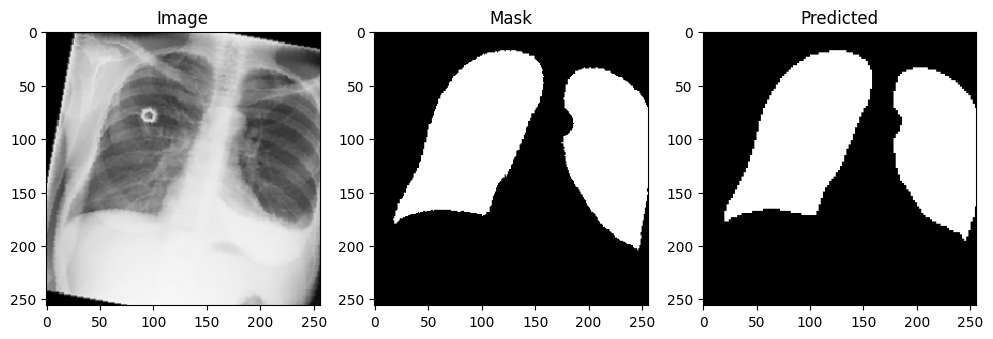

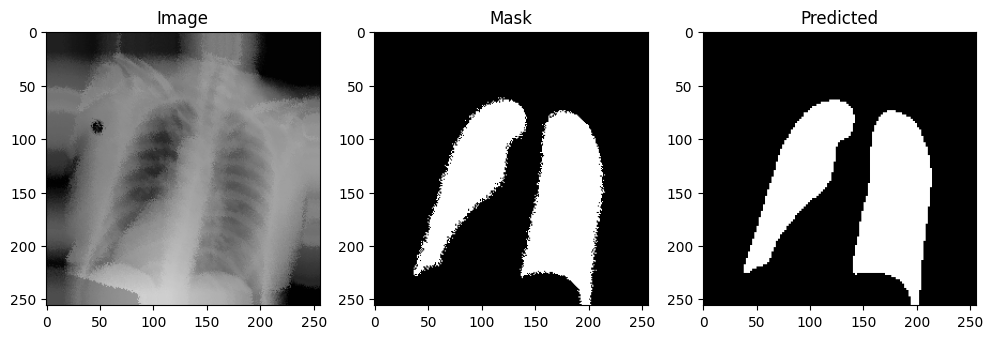

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 722s 136ms/step - accuracy: 0.9881 - binary_io_u_1: 0.9517 - dice_coefficient: 0.9647 - loss: 0.0275 - learning_rate: 0.0010
Epoch 33/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.9880 - binary_io_u_1: 0.9512 - dice_coefficient: 0.9643 - loss: 0.0277
Epoch 33: dice_coefficient improved from 0.96467 to 0.96468, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


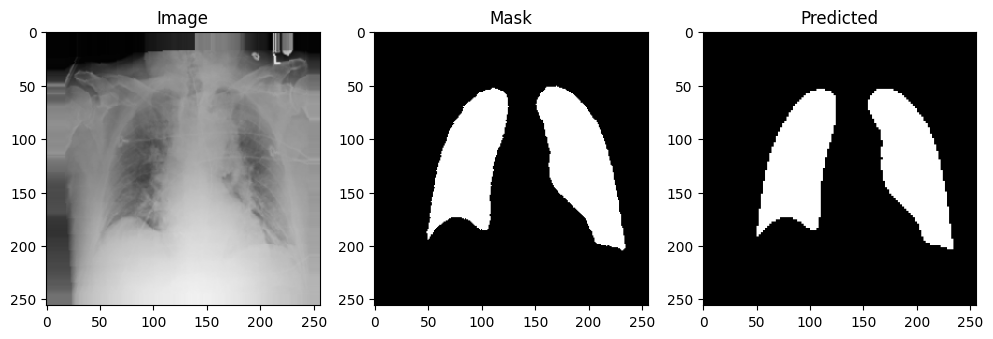

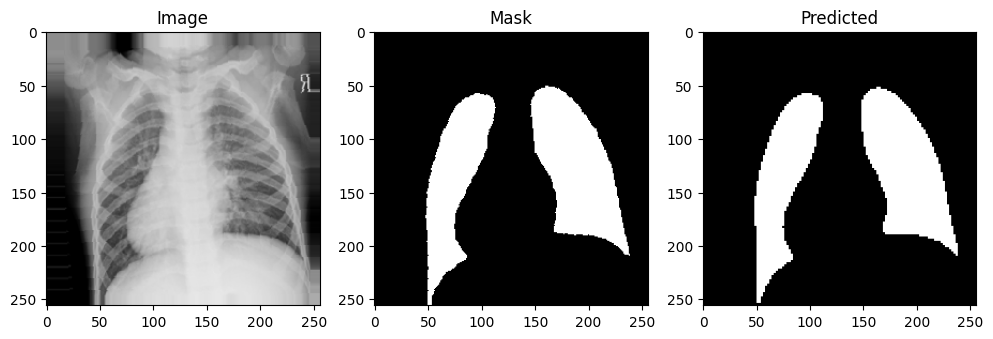

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 748s 141ms/step - accuracy: 0.9881 - binary_io_u_1: 0.9517 - dice_coefficient: 0.9647 - loss: 0.0274 - learning_rate: 0.0010
Epoch 34/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.9881 - binary_io_u_1: 0.9516 - dice_coefficient: 0.9645 - loss: 0.0275
Epoch 34: dice_coefficient improved from 0.96468 to 0.96488, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


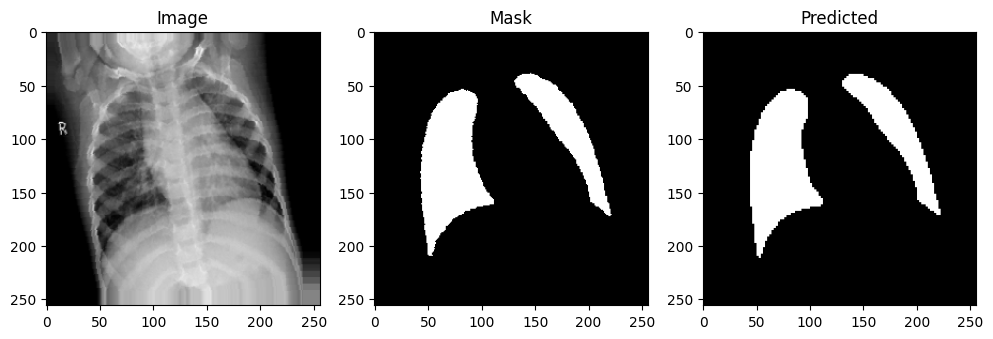

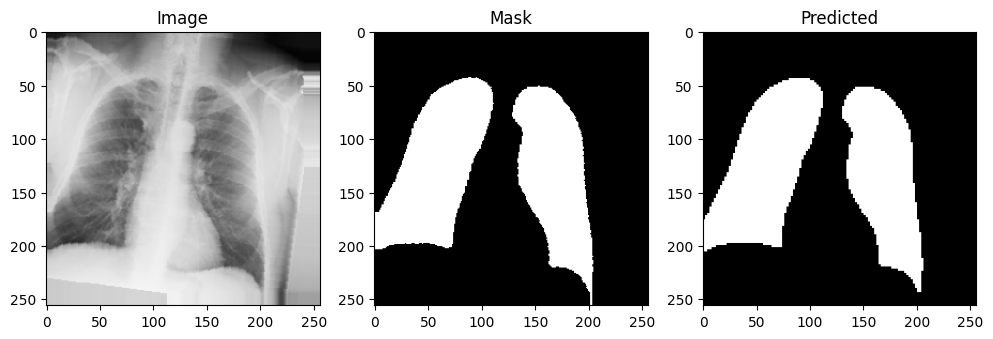

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 731s 138ms/step - accuracy: 0.9882 - binary_io_u_1: 0.9520 - dice_coefficient: 0.9649 - loss: 0.0272 - learning_rate: 0.0010
Epoch 35/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.9881 - binary_io_u_1: 0.9517 - dice_coefficient: 0.9647 - loss: 0.0274
Epoch 35: dice_coefficient improved from 0.96488 to 0.96502, saving model to ./models/segmentation/best_segmentation_model.keras


2025-10-13 21:50:08.988368: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 643ms/step


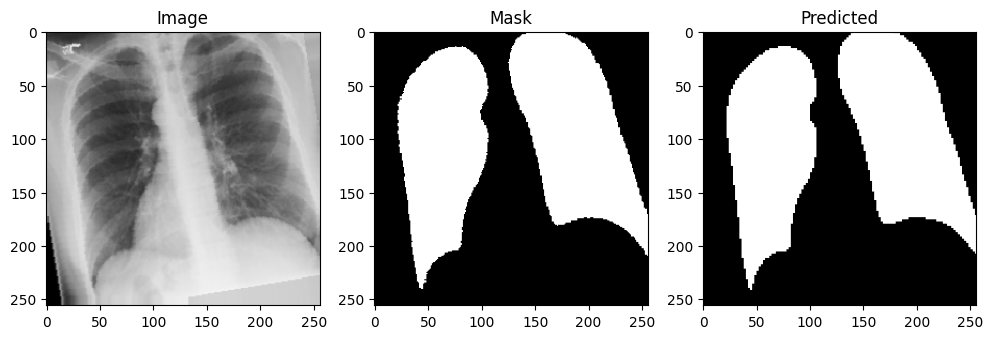

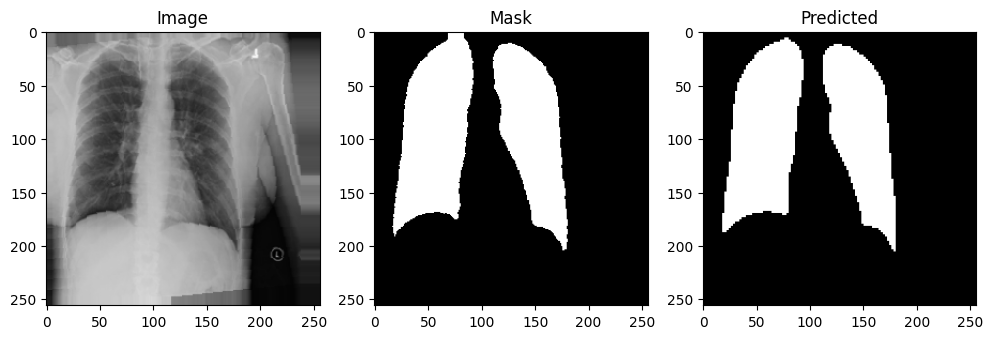

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 714s 135ms/step - accuracy: 0.9882 - binary_io_u_1: 0.9521 - dice_coefficient: 0.9650 - loss: 0.0272 - learning_rate: 0.0010
Epoch 36/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 0.9881 - binary_io_u_1: 0.9519 - dice_coefficient: 0.9649 - loss: 0.0274
Epoch 36: dice_coefficient improved from 0.96502 to 0.96511, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


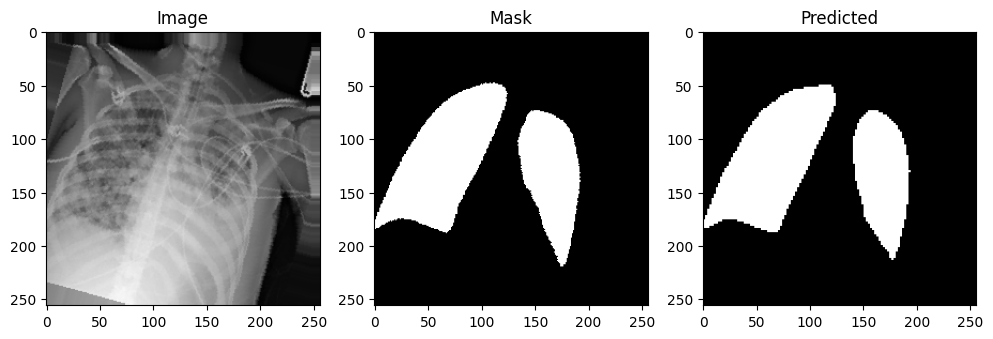

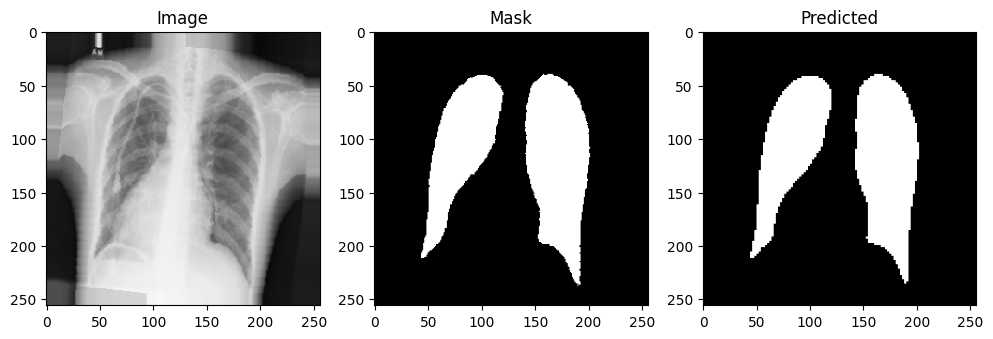

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 709s 134ms/step - accuracy: 0.9882 - binary_io_u_1: 0.9522 - dice_coefficient: 0.9651 - loss: 0.0271 - learning_rate: 0.0010
Epoch 37/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 0.9881 - binary_io_u_1: 0.9518 - dice_coefficient: 0.9649 - loss: 0.0273
Epoch 37: dice_coefficient improved from 0.96511 to 0.96520, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step


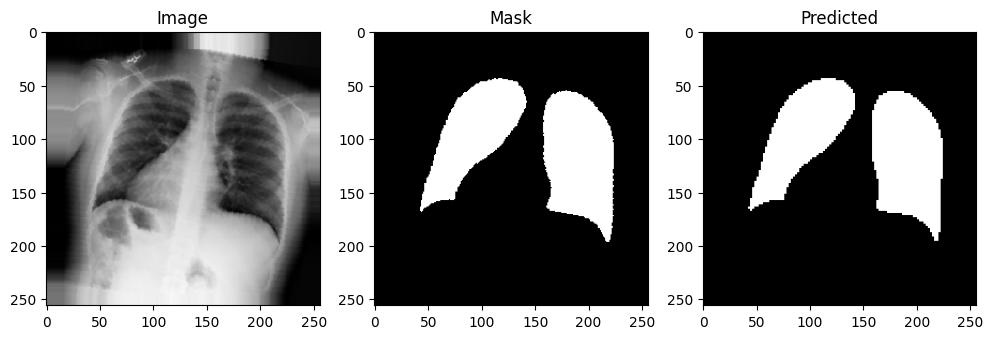

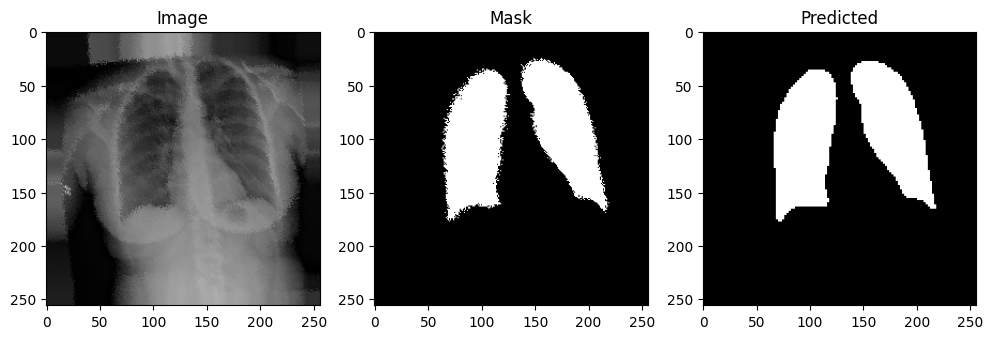

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 707s 134ms/step - accuracy: 0.9882 - binary_io_u_1: 0.9523 - dice_coefficient: 0.9652 - loss: 0.0270 - learning_rate: 0.0010
Epoch 38/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 0.9882 - binary_io_u_1: 0.9520 - dice_coefficient: 0.9649 - loss: 0.0272
Epoch 38: dice_coefficient did not improve from 0.96520
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


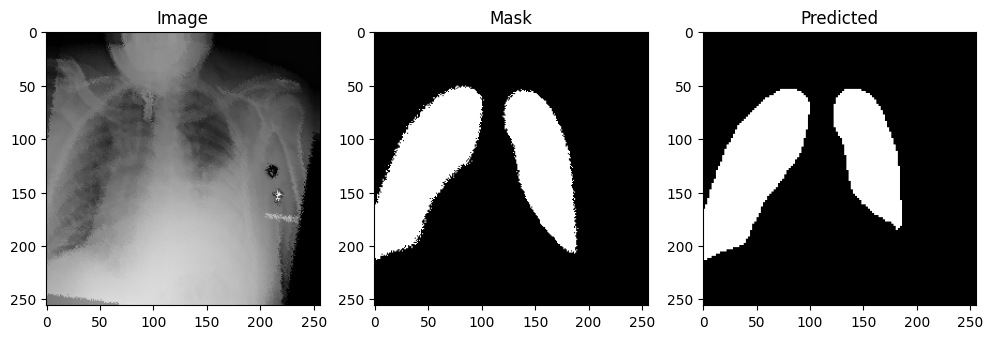

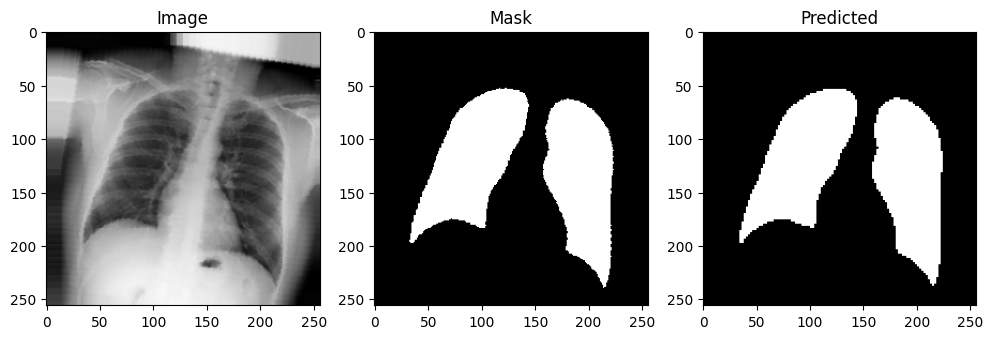

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 706s 133ms/step - accuracy: 0.9882 - binary_io_u_1: 0.9523 - dice_coefficient: 0.9651 - loss: 0.0270 - learning_rate: 0.0010
Epoch 39/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 0.9882 - binary_io_u_1: 0.9524 - dice_coefficient: 0.9653 - loss: 0.0270
Epoch 39: dice_coefficient improved from 0.96520 to 0.96532, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step


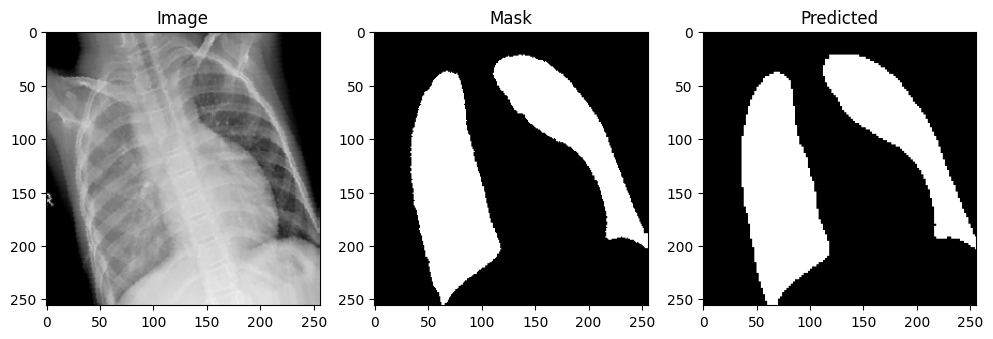

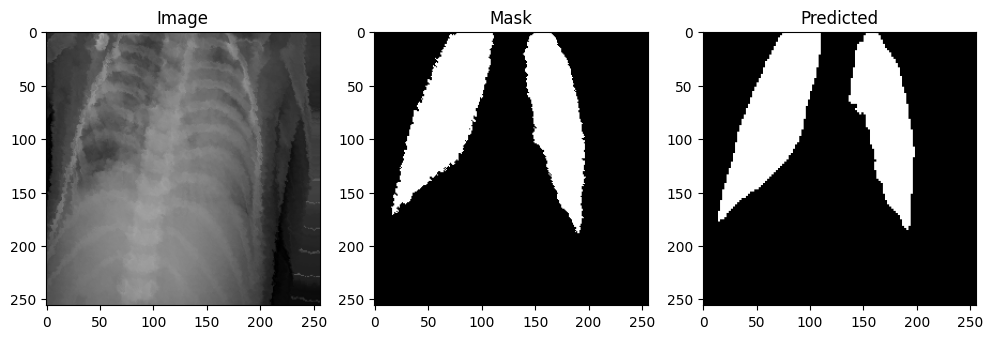

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 709s 134ms/step - accuracy: 0.9883 - binary_io_u_1: 0.9525 - dice_coefficient: 0.9653 - loss: 0.0269 - learning_rate: 0.0010
Epoch 40/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.9882 - binary_io_u_1: 0.9523 - dice_coefficient: 0.9651 - loss: 0.0270
Epoch 40: dice_coefficient improved from 0.96532 to 0.96534, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


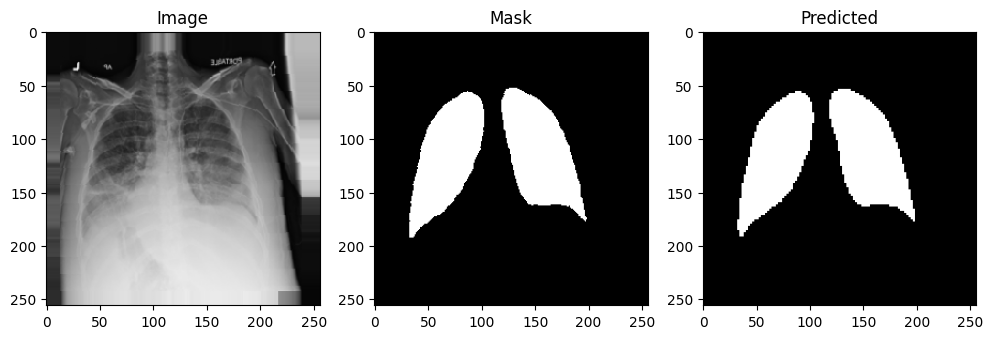

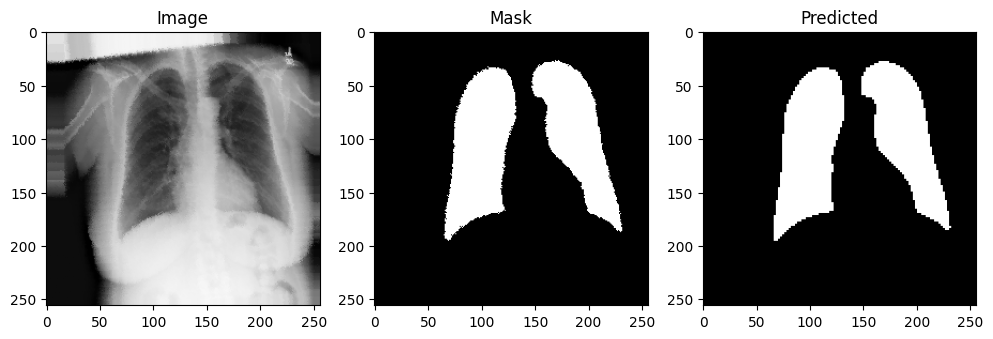

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 699s 132ms/step - accuracy: 0.9883 - binary_io_u_1: 0.9525 - dice_coefficient: 0.9653 - loss: 0.0268 - learning_rate: 0.0010
Epoch 41/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 0.9882 - binary_io_u_1: 0.9522 - dice_coefficient: 0.9650 - loss: 0.0271
Epoch 41: dice_coefficient did not improve from 0.96534
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step


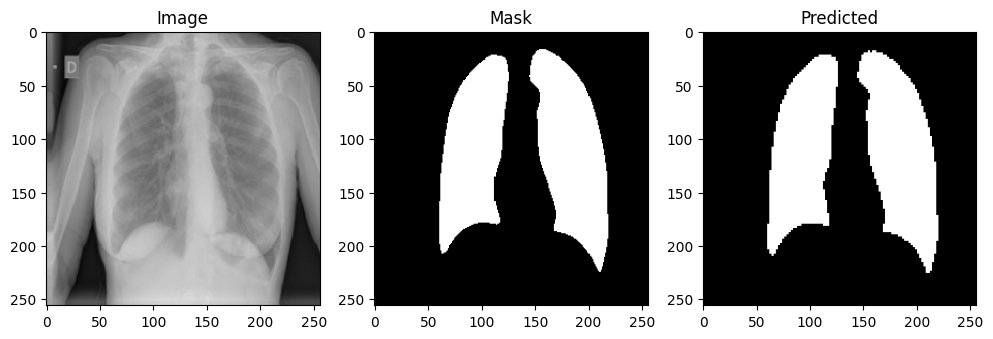

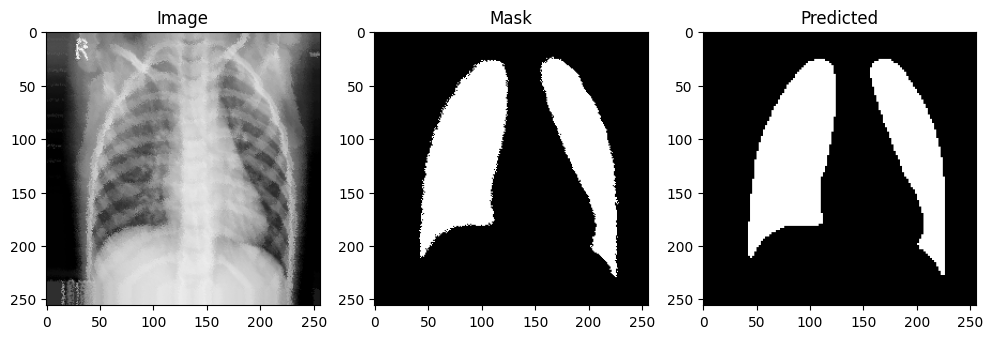

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 709s 134ms/step - accuracy: 0.9883 - binary_io_u_1: 0.9524 - dice_coefficient: 0.9652 - loss: 0.0270 - learning_rate: 0.0010
Epoch 42/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.9883 - binary_io_u_1: 0.9524 - dice_coefficient: 0.9653 - loss: 0.0269
Epoch 42: dice_coefficient did not improve from 0.96534
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


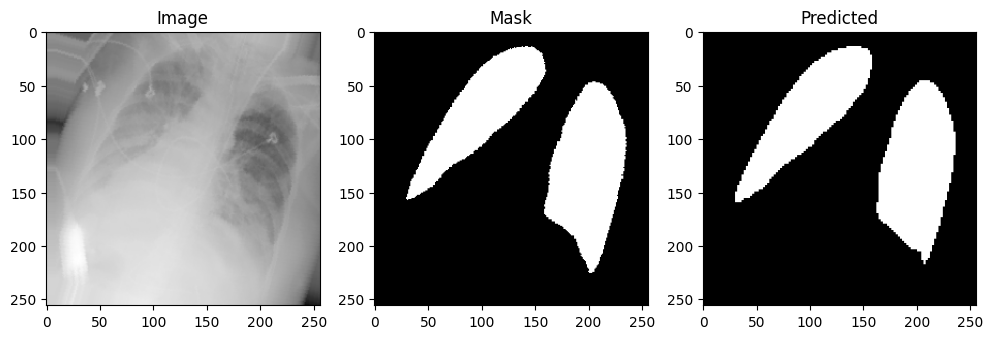

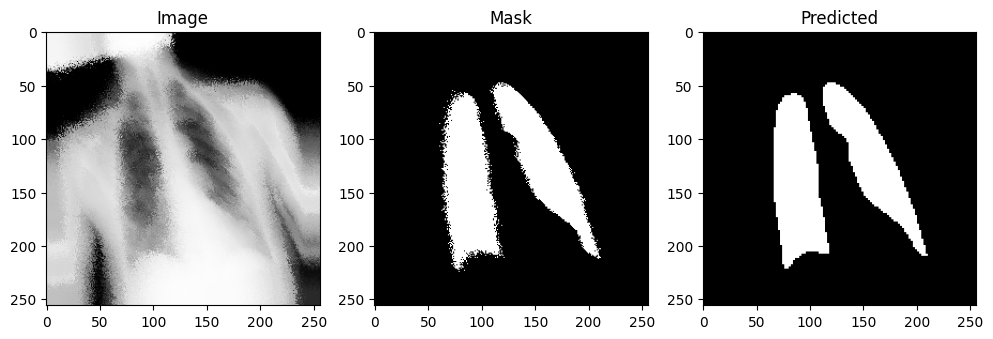

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 727s 137ms/step - accuracy: 0.9883 - binary_io_u_1: 0.9525 - dice_coefficient: 0.9653 - loss: 0.0269 - learning_rate: 0.0010
Epoch 43/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9883 - binary_io_u_1: 0.9525 - dice_coefficient: 0.9653 - loss: 0.0269
Epoch 43: dice_coefficient improved from 0.96534 to 0.96548, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 734ms/step


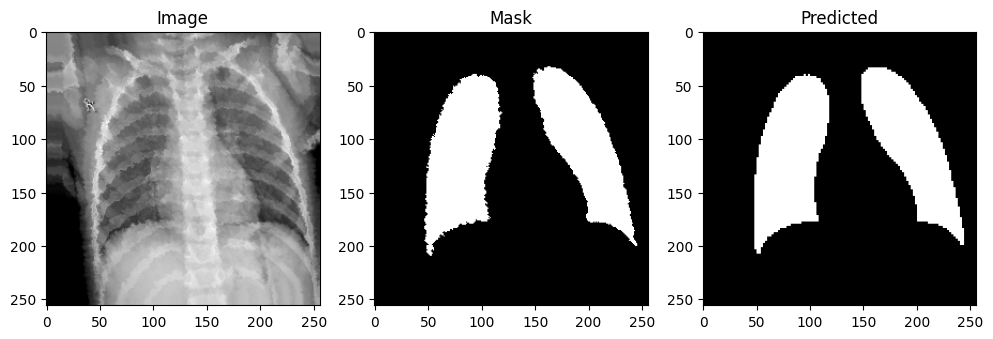

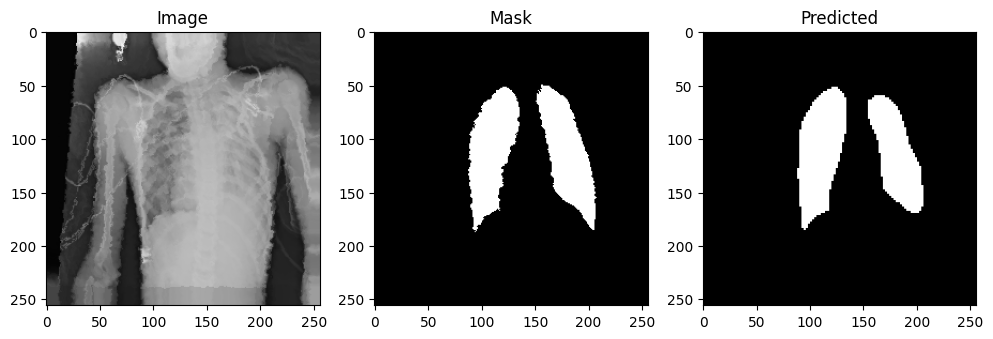

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 704s 133ms/step - accuracy: 0.9883 - binary_io_u_1: 0.9527 - dice_coefficient: 0.9655 - loss: 0.0268 - learning_rate: 0.0010
Epoch 44/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 0.9883 - binary_io_u_1: 0.9524 - dice_coefficient: 0.9653 - loss: 0.0269
Epoch 44: dice_coefficient improved from 0.96548 to 0.96567, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


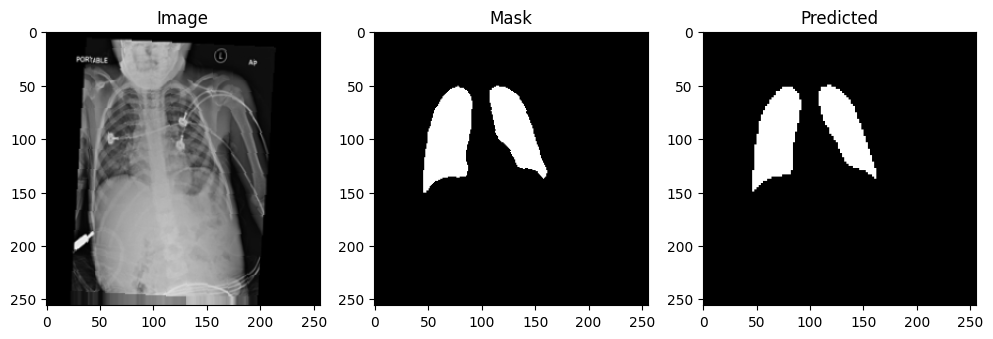

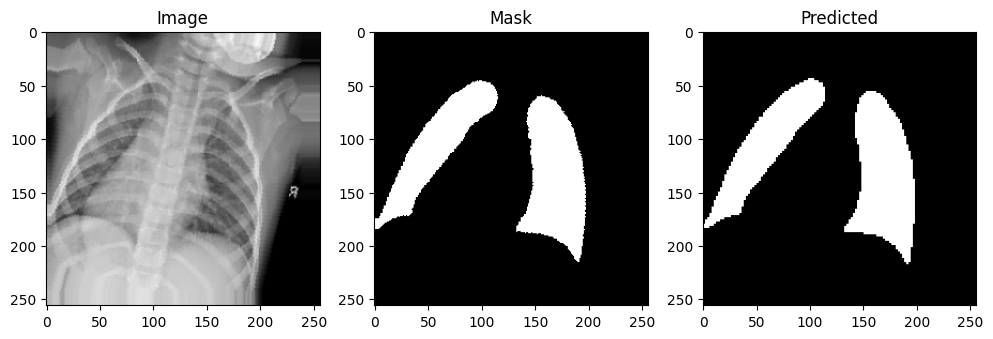

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 713s 135ms/step - accuracy: 0.9884 - binary_io_u_1: 0.9529 - dice_coefficient: 0.9657 - loss: 0.0265 - learning_rate: 0.0010
Epoch 45/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9883 - binary_io_u_1: 0.9527 - dice_coefficient: 0.9655 - loss: 0.0267
Epoch 45: dice_coefficient improved from 0.96567 to 0.96567, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


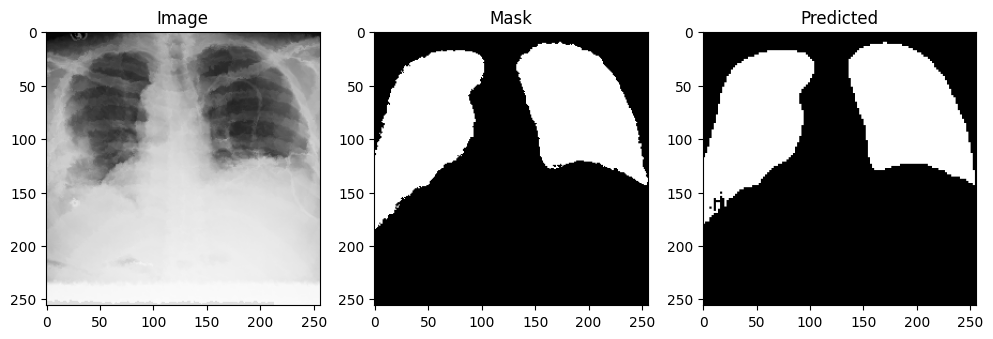

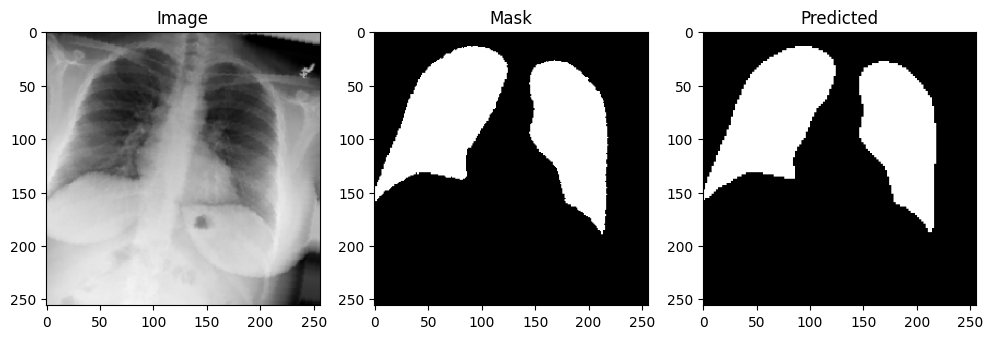

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 706s 133ms/step - accuracy: 0.9884 - binary_io_u_1: 0.9530 - dice_coefficient: 0.9657 - loss: 0.0266 - learning_rate: 0.0010
Epoch 46/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9884 - binary_io_u_1: 0.9528 - dice_coefficient: 0.9656 - loss: 0.0267
Epoch 46: dice_coefficient improved from 0.96567 to 0.96580, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


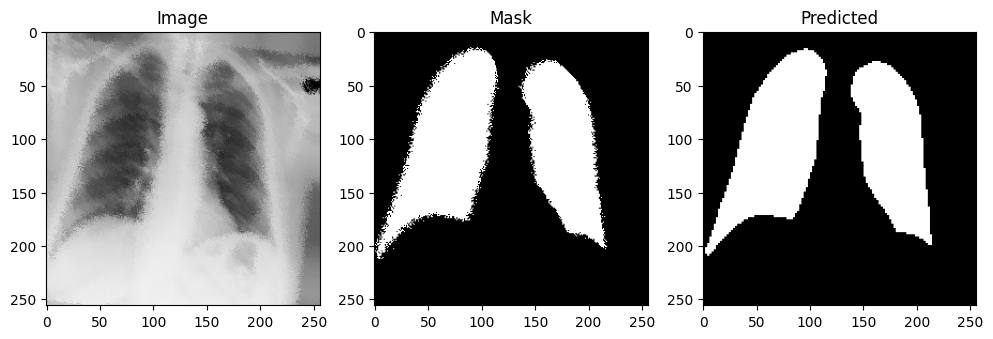

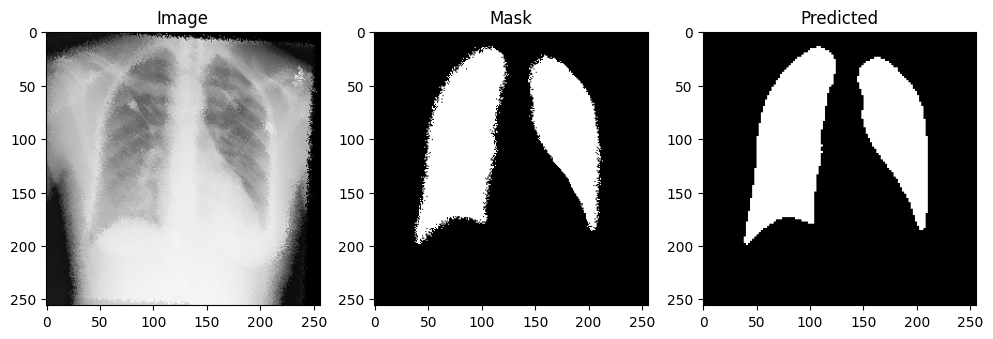

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 709s 134ms/step - accuracy: 0.9884 - binary_io_u_1: 0.9532 - dice_coefficient: 0.9658 - loss: 0.0265 - learning_rate: 0.0010
Epoch 47/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 0.9884 - binary_io_u_1: 0.9530 - dice_coefficient: 0.9656 - loss: 0.0266
Epoch 47: dice_coefficient did not improve from 0.96580
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


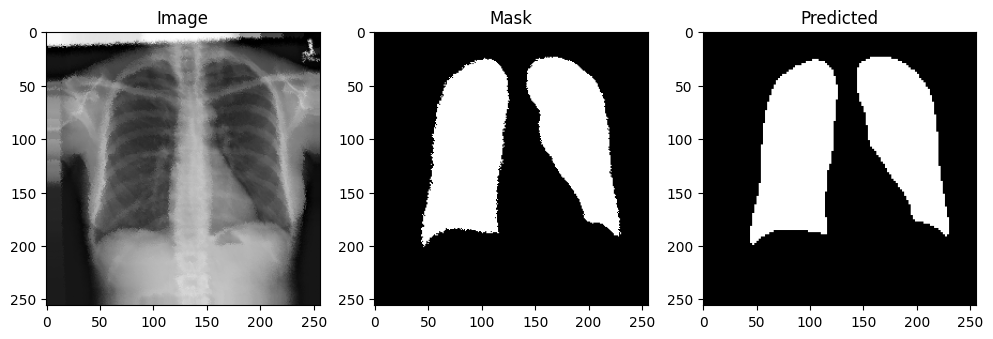

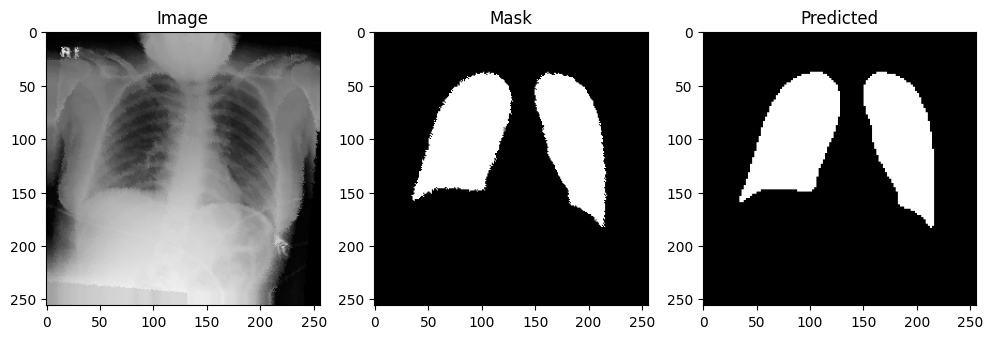

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 706s 133ms/step - accuracy: 0.9884 - binary_io_u_1: 0.9530 - dice_coefficient: 0.9657 - loss: 0.0266 - learning_rate: 0.0010
Epoch 48/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9884 - binary_io_u_1: 0.9532 - dice_coefficient: 0.9658 - loss: 0.0265
Epoch 48: dice_coefficient improved from 0.96580 to 0.96591, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 589ms/step


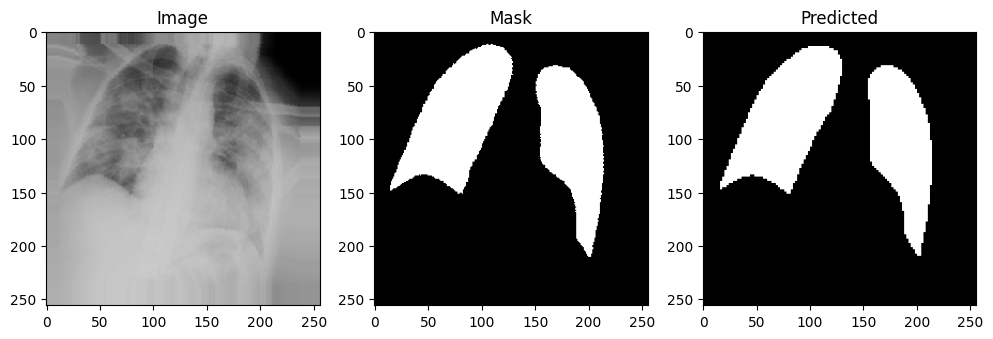

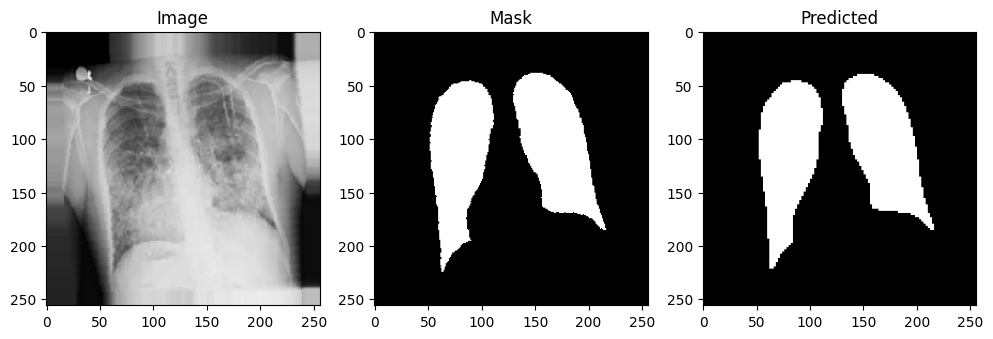

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 707s 133ms/step - accuracy: 0.9885 - binary_io_u_1: 0.9533 - dice_coefficient: 0.9659 - loss: 0.0264 - learning_rate: 0.0010
Epoch 49/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 0.9885 - binary_io_u_1: 0.9533 - dice_coefficient: 0.9659 - loss: 0.0264
Epoch 49: dice_coefficient improved from 0.96591 to 0.96600, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


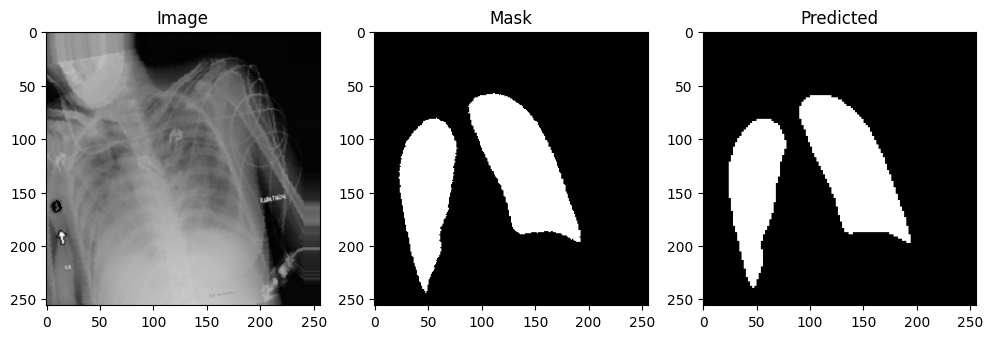

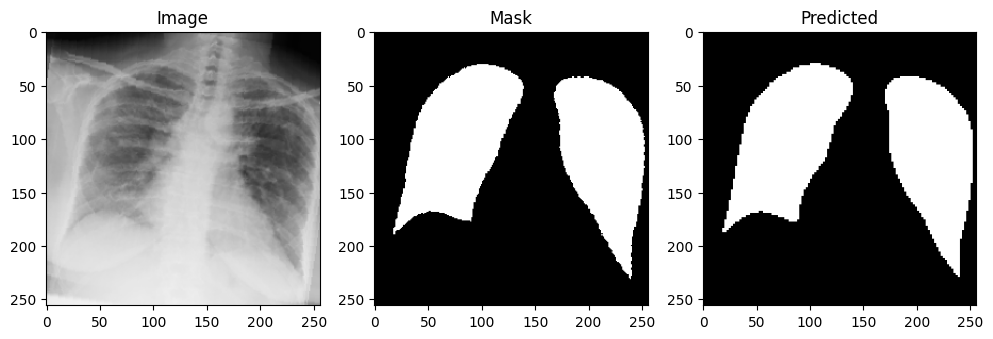

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 707s 134ms/step - accuracy: 0.9885 - binary_io_u_1: 0.9534 - dice_coefficient: 0.9660 - loss: 0.0263 - learning_rate: 0.0010
Epoch 50/50
5292/5292 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9885 - binary_io_u_1: 0.9533 - dice_coefficient: 0.9660 - loss: 0.0264
Epoch 50: dice_coefficient improved from 0.96600 to 0.96603, saving model to ./models/segmentation/best_segmentation_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 756ms/step


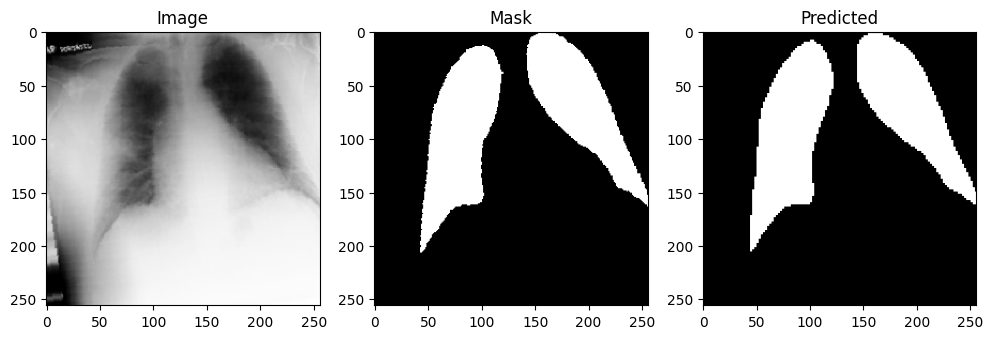

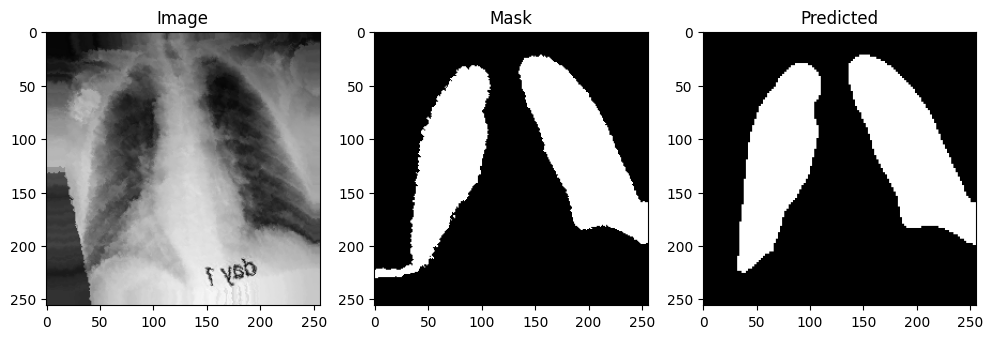

5292/5292 ━━━━━━━━━━━━━━━━━━━━ 706s 133ms/step - accuracy: 0.9885 - binary_io_u_1: 0.9534 - dice_coefficient: 0.9660 - loss: 0.0263 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 50.


In [24]:
# Continue training with Epoch 24 as Initial epoch
NUM_EPOCHS = 50
INITIAL_EPOCH = 24
history = model.fit(
    train_dataset.repeat(),
    initial_epoch= INITIAL_EPOCH,
    epochs= NUM_EPOCHS,
    steps_per_epoch= steps_per_epoch,
    callbacks= callbacks
)

---
## Section 7: Conclusion and Analysis of Segmentation Results

This final section summarizes the entire deep learning workflow, evaluates the performance of the streamlined U-Net Xception model, and discusses the key takeaways from the training process.

---

### 7.1 Summary of the End-to-End Pipeline

The project successfully implemented a specialized segmentation pipeline focused solely on lung region extraction, transitioning from a complex multi-task model to a highly efficient, single-head U-Net Xception architecture.

* **Data Preparation:** The pipeline utilized an optimized `tf.data.Dataset` for parallel processing of TFRecord data, incorporating mandatory **synchronized augmentation** (geometric and elastic) for robust training.
* **Model Architecture:** The U-Net was chosen for its effective fusion of high-level context and low-level detail, while the **Separable Convolutions** in the encoder significantly reduced complexity without sacrificing feature extraction power. 
* **Training Strategy:** Training leveraged a suite of control callbacks (Early Stopping, LR Reduction) and was successfully conducted and resumed, demonstrating robust fault tolerance enabled by the Model Checkpoint mechanism.

### 7.2 Performance Evaluation (Based on Training Logs)

Analyzing the metrics logged over the successful epochs provides definitive proof of the model's effectiveness in segmenting the lung regions.

* **Primary Metric (Dice Coefficient):** The training logs show the model achieved a final best **Dice Coefficient** (F1 Score) of approximately **0.96603**. This score indicates excellent overlap between the predicted and ground truth masks, confirming the model's high precision and recall in identifying the target structure.
* **Secondary Metric (IoU):** The Intersection over Union metric closely mirrored the Dice score, confirming the strong spatial agreement between prediction and label.
* **Convergence:** The training history demonstrates rapid initial learning (steep drop in Binary Crossentropy loss) followed by a stable plateau, indicating efficient convergence. The **ReduceLROnPlateau** callback likely played a role in fine-tuning the weights during this stable phase. 

### 7.3 Architectural Success

The decision to streamline the model to a single segmentation head and utilize the Xception-style encoder proved highly effective. This approach simplifies the loss landscape and concentrates the model's capacity entirely on the task of pixel localization, resulting in a high-quality, specialized segmentation tool. The use of custom metrics (Dice and IoU) ensured that the evaluation accurately reflected the model's true performance on the highly imbalanced segmentation task.